<a href="https://colab.research.google.com/github/Marconi-Lab/Solar_irradiation/blob/rm%2Fdata_cleaning/NASA_param_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# Accessing Github data files from colab
from google.colab import userdata
token = userdata.get('github')
!git clone -b rm/data_cleaning https://{token}@github.com/Marconi-Lab/Solar_irradiation.git

Cloning into 'Solar_irradiation'...
remote: Enumerating objects: 19408, done.
remote: Counting objects: 100% (50/50), done.
remote: Compressing objects: 100% (43/43), done.
remote: Total 19408 (delta 12), reused 9 (delta 7), pack-reused 19358 (from 3)
Receiving objects: 100% (19408/19408), 239.12 MiB | 16.85 MiB/s, done.
Resolving deltas: 100% (2914/2914), done.


In [3]:
#@title Imports
!pip install pvlib --q
import pvlib
from pathlib import Path
import requests
import pandas as pd
import numpy as np
from io import StringIO
from matplotlib import pyplot as plt
import seaborn as sns

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.3/19.3 MB 40.8 MB/s eta 0:00:00


In [4]:
#@title Directories


# For colab
measurement_folder = Path("/content/Solar_irradiation/jupyter_notebooks/Data/irradiation_measurements")

# # For local
# measurement_folder = Path("Data/irradiation_measurements")

ministry_folder = measurement_folder / 'ministry_energy_ug'
cbe_folder = measurement_folder / 'CBE_Data'

data_path = Path('/content/drive/MyDrive/GIZ_Irradiation_Project/Working Folder/Data')
nasa_data = data_path / 'nasa_power_data'

ministry_file = list(ministry_folder.glob('*.csv'))
cbe_file = list(cbe_folder.glob('*.csv'))
nasa_data_files = list(nasa_data.glob('*.csv'))

all_files = ministry_file + cbe_file + nasa_data_files
all_files.sort()
all_files

[PosixPath('/content/Solar_irradiation/jupyter_notebooks/Data/irradiation_measurements/CBE_Data/egypt.csv'),
 PosixPath('/content/Solar_irradiation/jupyter_notebooks/Data/irradiation_measurements/CBE_Data/ghana.csv'),
 PosixPath('/content/Solar_irradiation/jupyter_notebooks/Data/irradiation_measurements/CBE_Data/kenya.csv'),
 PosixPath('/content/Solar_irradiation/jupyter_notebooks/Data/irradiation_measurements/CBE_Data/madagascar.csv'),
 PosixPath('/content/Solar_irradiation/jupyter_notebooks/Data/irradiation_measurements/CBE_Data/nigeria.csv'),
 PosixPath('/content/Solar_irradiation/jupyter_notebooks/Data/irradiation_measurements/CBE_Data/somalia.csv'),
 PosixPath('/content/Solar_irradiation/jupyter_notebooks/Data/irradiation_measurements/ministry_energy_ug/soroti.csv'),
 PosixPath('/content/Solar_irradiation/jupyter_notebooks/Data/irradiation_measurements/ministry_energy_ug/wadelai.csv'),
 PosixPath('/content/drive/MyDrive/GIZ_Irradiation_Project/Working Folder/Data/nasa_power_data/e

In [5]:
#@title Compute Error and altitude


def get_altitude_pvib(df):

    locations = df['location'].unique()

    for location in locations:
        latitude = df[df['location'] == location]['latitude'].iloc[0]
        longitude = df[df['location'] == location]['longitude'].iloc[0]
        altitude = pvlib.location.lookup_altitude(latitude, longitude)
        df.loc[df['location'] == location, 'altitude'] = altitude

    return df

def compute_error(df):
    """
    Compute daily error and signed square error between ground data and estimators for a site.

    Parameters:
    -----------
    df : pandas.DataFrame
        DataFrame containing ground data and estimators for a site
    Returns:
    --------
    pandas.DataFrame
        DataFrame with daily percentage errors for each estimator and location
    """

    df = get_altitude_pvib(df)
    df['error'] = df['ghi'] - df['ALLSKY_SFC_SW_DWN']
    df['sq_error'] = np.sign(df['error']) * (df['error'] ** 2).round(4)

    return df

In [6]:
#@title Data Prep
egypt_df = pd.read_csv(cbe_folder / 'egypt.csv')
ghana_df = pd.read_csv(cbe_folder / 'ghana.csv')
kenya_df = pd.read_csv(cbe_folder / 'kenya.csv')
madagascar_df = pd.read_csv(cbe_folder / 'madagascar.csv')
nigeria_df = pd.read_csv(cbe_folder / 'nigeria.csv')
somalia_df = pd.read_csv(cbe_folder / 'somalia.csv')
soroti_df = pd.read_csv(ministry_folder / 'soroti.csv')
wadelai_df = pd.read_csv(ministry_folder / 'wadelai.csv')

egypt_est = pd.read_csv(nasa_data / 'egypt.csv')
ghana_est = pd.read_csv(nasa_data / 'ghana.csv')
kenya_est = pd.read_csv(nasa_data / 'kenya.csv')
madagascar_est = pd.read_csv(nasa_data / 'madagascar.csv')
nigeria_est = pd.read_csv(nasa_data / 'nigeria.csv')
somalia_est = pd.read_csv(nasa_data / 'somalia.csv')
soroti_est = pd.read_csv(nasa_data / 'soroti.csv')
wadelai_est = pd.read_csv(nasa_data / 'wadelai.csv')

egypt_df['ghi'] = (egypt_df['ghi'] / 1000).round(4)
ghana_df['ghi'] = (ghana_df['ghi'] / 1000).round(4)
kenya_df['ghi'] = (kenya_df['ghi'] / 1000).round(4)
madagascar_df['ghi'] = (madagascar_df['ghi'] / 1000).round(4)
nigeria_df['ghi'] = (nigeria_df['ghi'] / 1000).round(4)
somalia_df['ghi'] = (somalia_df['ghi'] / 1000).round(4)
soroti_df['ghi'] = (soroti_df['ghi'] / 1000).round(4)
wadelai_df['ghi'] = (wadelai_df['ghi'] / 1000).round(4)

egypt = egypt_df.merge(egypt_est, on=['datetime', 'location'], how='inner')
ghana = ghana_df.merge(ghana_est, on=['datetime', 'location'], how='inner')
kenya = kenya_df.merge(kenya_est, on=['datetime', 'location'], how='inner')
madagascar = madagascar_df.merge(madagascar_est, on=['datetime', 'location'], how='inner')
nigeria = nigeria_df.merge(nigeria_est, on=['datetime', 'location'], how='inner')
somalia = somalia_df.merge(somalia_est, on=['datetime', 'location'], how='inner')
soroti = soroti_df.merge(soroti_est, on=['datetime', 'location'], how='inner')
wadelai = wadelai_df.merge(wadelai_est, on=['datetime', 'location'], how='inner')

egypt = compute_error(egypt)
ghana = compute_error(ghana)
kenya = compute_error(kenya)
madagascar = compute_error(madagascar)
nigeria = compute_error(nigeria)
somalia = compute_error(somalia)
soroti = compute_error(soroti)
wadelai = compute_error(wadelai)

meta_columns = ['latitude', 'longitude']
egypt.drop(meta_columns, axis=1, inplace=True)
ghana.drop(meta_columns, axis=1, inplace=True)
kenya.drop(meta_columns, axis=1, inplace=True)
madagascar.drop(meta_columns, axis=1, inplace=True)
nigeria.drop(meta_columns, axis=1, inplace=True)
somalia.drop(meta_columns, axis=1, inplace=True)
soroti.drop(meta_columns, axis=1, inplace=True)
wadelai.drop(meta_columns, axis=1, inplace=True)

egypt.index = pd.to_datetime(egypt['datetime'])
ghana.index = pd.to_datetime(ghana['datetime'])
kenya.index = pd.to_datetime(kenya['datetime'])
madagascar.index = pd.to_datetime(madagascar['datetime'])
nigeria.index = pd.to_datetime(nigeria['datetime'])
somalia.index = pd.to_datetime(somalia['datetime'])
soroti.index = pd.to_datetime(soroti['datetime'])
wadelai.index = pd.to_datetime(wadelai['datetime'])

# replace null values with zeros
egypt.fillna(0, inplace=True)
ghana.fillna(0, inplace=True)
kenya.fillna(0, inplace=True)
madagascar.fillna(0, inplace=True)
nigeria.fillna(0, inplace=True)
somalia.fillna(0, inplace=True)
soroti.fillna(0, inplace=True)
wadelai.fillna(0, inplace=True)

print(f'Egypt: {egypt.shape}, {egypt_df.shape}, {egypt_est.shape}')
print(f'Ghana: {ghana.shape}, {ghana_df.shape}, {ghana_est.shape}')
print(f'Kenya: {kenya.shape}, {kenya_df.shape}, {kenya_est.shape}')
print(f'Madagascar: {madagascar.shape}, {madagascar_df.shape}, {madagascar_est.shape}')
print(f'Nigeria: {nigeria.shape}, {nigeria_df.shape}, {nigeria_est.shape}')
print(f'Somalia: {somalia.shape}, {somalia_df.shape}, {somalia_est.shape}')
print(f'Soroti: {soroti.shape}, {soroti_df.shape}, {soroti_est.shape}')
print(f'Wadelai: {wadelai.shape}, {wadelai_df.shape}, {wadelai_est.shape}')

Egypt: (452, 71), (452, 5), (452, 67)
Ghana: (4199, 71), (4199, 5), (4814, 67)
Kenya: (10224, 71), (10224, 5), (10763, 67)
Madagascar: (1056, 71), (1056, 5), (1076, 67)
Nigeria: (2306, 71), (2306, 5), (2371, 67)
Somalia: (296, 71), (296, 5), (303, 67)
Soroti: (699, 71), (699, 5), (700, 67)
Wadelai: (699, 71), (699, 5), (700, 67)


In [7]:
#date range for each location
print(f'Egypt: {egypt.index.min()} - {egypt.index.max()}')
print(f'Ghana: {ghana.index.min()} - {ghana.index.max()}')
print(f'Kenya: {kenya.index.min()} - {kenya.index.max()}')
print(f'Madagascar: {madagascar.index.min()} - {madagascar.index.max()}')
print(f'Nigeria: {nigeria.index.min()} - {nigeria.index.max()}')
print(f'Somalia: {somalia.index.min()} - {somalia.index.max()}')
print(f'Soroti: {soroti.index.min()} - {soroti.index.max()}')
print(f'Wadelai: {wadelai.index.min()} - {wadelai.index.max()}')

Egypt: 2023-09-01 00:00:00 - 2024-11-25 00:00:00
Ghana: 2019-09-24 00:00:00 - 2024-11-25 00:00:00
Kenya: 2019-05-28 00:00:00 - 2024-11-25 00:00:00
Madagascar: 2023-02-13 00:00:00 - 2024-11-25 00:00:00
Nigeria: 2020-04-04 00:00:00 - 2024-11-25 00:00:00
Somalia: 2024-01-28 00:00:00 - 2024-11-25 00:00:00
Soroti: 2020-02-01 00:00:00 - 2021-12-31 00:00:00
Wadelai: 2020-02-01 00:00:00 - 2021-12-31 00:00:00


In [8]:
def extract_year_data(df, year):
    return df[df.index.year == year]

def extract_all_years(df):
    return {year: extract_year_data(df, year) for year in sorted(df.index.year.unique())}

egypt_years = extract_all_years(egypt)
ghana_years = extract_all_years(ghana)
kenya_years = extract_all_years(kenya)
madagascar_years = extract_all_years(madagascar)
nigeria_years = extract_all_years(nigeria)
somalia_years = extract_all_years(somalia)
soroti_years = extract_all_years(soroti)
wadelai_years = extract_all_years(wadelai)


print(f'Egypt: {egypt_years.keys()}')
print(f'Ghana: {ghana_years.keys()}')
print(f'Kenya: {kenya_years.keys()}')
print(f'Madagascar: {madagascar_years.keys()}')
print(f'Nigeria: {nigeria_years.keys()}')
print(f'Somalia: {somalia_years.keys()}')
print(f'Soroti: {soroti_years.keys()}')
print(f'Wadelai: {wadelai_years.keys()}')

Egypt: dict_keys([2023, 2024])
Ghana: dict_keys([2019, 2020, 2021, 2022, 2023, 2024])
Kenya: dict_keys([2019, 2020, 2021, 2022, 2023, 2024])
Madagascar: dict_keys([2023, 2024])
Nigeria: dict_keys([2020, 2021, 2022, 2023, 2024])
Somalia: dict_keys([2024])
Soroti: dict_keys([2020, 2021])
Wadelai: dict_keys([2020, 2021])


In [9]:
# merge all locations in one dataframe
all_locations = [egypt, ghana, kenya, madagascar, nigeria, somalia, soroti, wadelai]
df = pd.concat(all_locations)
df

,datetime,ghi,location,T2M,ALLSKY_SFC_SW_DWN,RH2M,WS2M,T2MDEW,T2M_MAX,T2M_MIN,...,RHOA,SRF_ALB_ADJ,TO3,TQV,U2M,V2M,Z0M,altitude,error,sq_error
datetime,,,,,,,,,,,,,,,,,,,,,
2023-09-01,2023-09-01,6.4281,egypt_location1,29.35,7.15,59.34,4.30,19.29,36.33,24.42,...,1.14,0.36,283.56,28.08,-0.46,-4.25,0.01,110.0,-0.7219,-0.5211
2023-09-02,2023-09-02,6.6018,egypt_location1,28.94,7.10,54.39,3.97,17.31,36.27,22.82,...,1.15,0.36,278.52,26.49,-0.11,-3.93,0.01,110.0,-0.4982,-0.2482
2023-09-03,2023-09-03,6.6006,egypt_location1,28.55,7.05,54.41,3.74,17.12,34.62,23.46,...,1.15,0.36,282.32,22.75,0.42,-3.61,0.01,110.0,-0.4494,-0.2020
2023-09-04,2023-09-04,6.3911,egypt_location1,28.37,7.11,50.16,1.61,15.61,33.97,22.60,...,1.14,0.36,283.53,21.21,0.66,-1.31,0.01,110.0,-0.7189,-0.5168
2023-09-05,2023-09-05,6.3730,egypt_location1,30.54,7.11,36.23,0.94,12.53,36.72,24.05,...,1.13,0.36,282.76,19.28,-0.19,-0.14,0.01,110.0,-0.7370,-0.5432
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-27,2021-12-27,5.5400,wadelai,26.15,5.62,60.20,2.06,16.81,33.46,19.48,...,1.05,0.14,242.21,34.24,-0.96,-0.91,0.07,642.0,-0.0800,-0.0064
2021-12-28,2021-12-28,6.5000,wadelai,26.20,5.92,64.58,2.11,18.18,32.58,21.13,...,1.05,0.14,242.68,35.45,-0.63,-1.26,0.07,642.0,0.5800,0.3364
2021-12-29,2021-12-29,6.2400,wadelai,24.92,6.03,64.94,2.28,17.29,30.71,20.64,...,1.05,0.14,240.63,37.50,-0.22,-2.04,0.07,642.0,0.2100,0.0441


In [55]:
#@title NASA Power paramters
parameters_dict = {
    'Temperature at 2 Meters': 'T2M',
    'All Sky Surface Shortwave Downward Irradiance': 'ALLSKY_SFC_SW_DWN',
    'Relative Humidity at 2 Meters': 'RH2M',
    'Wind Speed at 2 Meters': 'WS2M',
    'Dew/Frost Point at 2 Meters': 'T2MDEW',
    'Temperature at 2 Meters Maximum': 'T2M_MAX',
    'Temperature at 2 Meters Minimum': 'T2M_MIN',
    'Surface Pressure': 'PS',
    'Wet Bulb Temperature at 2 Meters': 'T2MWET',
    'All Sky Surface Longwave Downward Irradiance': 'ALLSKY_SFC_LW_DWN',
    'All Sky Surface Shortwave Diffuse Irradiance': 'ALLSKY_SFC_SW_DIFF',
    'All Sky Surface Shortwave Downward Direct Normal Irradiance': 'ALLSKY_SFC_SW_DNI',
    'All Sky Surface Albedo': 'ALLSKY_SRF_ALB',
    'Cloud Amount': 'CLOUD_AMT',
    'Precipitation Corrected': 'PRECTOTCORR',
    'Top-Of-Atmosphere Shortwave Downward Irradiance': 'TOA_SW_DWN',
    'Profile Soil Moisture': 'GWETPROF',
    'Earth Skin Temperature': 'TS',
    'All Sky Surface Total PAR': 'ALLSKY_SFC_PAR_TOT',
    'Specific Humidity at 2 Meters': 'QV2M',
    'Temperature at 2 Meters Range': 'T2M_RANGE',
    'All Sky Insolation Clearness Index': 'ALLSKY_KT',
    'Clear Sky Surface Shortwave Downward Irradiance': 'CLRSKY_SFC_SW_DWN',
    'Root Zone Soil Wetness': 'GWETROOT',
    'Surface Soil Wetness': 'GWETTOP',
    'All Sky Surface UVA Irradiance': 'ALLSKY_SFC_UVA',
    'All Sky Surface UVB Irradiance': 'ALLSKY_SFC_UVB',
    'All Sky Surface UV Index': 'ALLSKY_SFC_UV_INDEX',
    'Clear Sky Insolation Clearness Index': 'CLRSKY_KT',
    'Clear Sky Surface Total PAR': 'CLRSKY_SFC_PAR_TOT',
    'Precipitable Water': 'PW',
    'Air Mass': 'AIRMASS',
    'All Sky Normalized Insolation Clearness Index': 'ALLSKY_NKT',
    'All Sky Surface Longwave Upward Irradiance': 'ALLSKY_SFC_LW_UP',
    'All Sky Surface Diffuse PAR': 'ALLSKY_SFC_PAR_DIFF',
    'All Sky Surface Direct Horizontal PAR': 'ALLSKY_SFC_PAR_DIRH',
    'All Sky Surface Shortwave Direct Horizontal Irradiance': 'ALLSKY_SFC_SW_DIRH',
    'All Sky Surface Shortwave Upward Irradiance': 'ALLSKY_SFC_SW_UP',
    'Adjusted Aerosol Optical Depth 55': 'AOD_55_ADJ',
    'Aerosol Optical Depth 84': 'AOD_84',
    'Cloud Optical Visible Depth': 'CLOUD_OD',
    'Clear Sky Days': 'CLRSKY_DAYS',
    'Clear Sky Normalized Insolation Clearness Index': 'CLRSKY_NKT',
    'Clear Sky Surface Longwave Downward Irradiance': 'CLRSKY_SFC_LW_DWN',
    'Clear Sky Surface Longwave Upward Irradiance': 'CLRSKY_SFC_LW_UP',
    'Clear Sky Surface Diffuse PAR': 'CLRSKY_SFC_PAR_DIFF',
    'Clear Sky Surface Direct Horizontal PAR': 'CLRSKY_SFC_PAR_DIRH',
    'Clear Sky Surface Shortwave Downward Diffuse Irradiance': 'CLRSKY_SFC_SW_DIFF',
    'Clear Sky Surface Shortwave Direct Horizontal Irradiance': 'CLRSKY_SFC_SW_DIRH',
    'Clear Sky Surface Shortwave Downward Direct Normal Irradiance': 'CLRSKY_SFC_SW_DNI',
    'Clear Sky Surface Shortwave Upward Irradiance': 'CLRSKY_SFC_SW_UP',
    'Clear Sky Surface Albedo': 'CLRSKY_SRF_ALB',
    'Zero Plane Displacement Height': 'DISPH',
    'Evaporation Land': 'EVLAND',
    'Evapotranspiration Energy Flux': 'EVPTRNS',
    'Ice Covered Fraction': 'FRSEAICE',
    'Planetary Boundary Layer Top Pressure': 'PBLTOP',
    'Peak Sun Hour': 'PSH',
    'Surface Air Density': 'RHOA',
    'Surface Albedo Adjusted': 'SRF_ALB_ADJ',
    'Total Column Ozone': 'TO3',
    'Total Column Precipitable Water': 'TQV',
    'Eastward Wind at 2 Meters': 'U2M',
    'Northward Wind at 2 Meters': 'V2M',
    'Surface Roughness': 'Z0M'
}
parameters_array = list(parameters_dict.values())
# add altitude to parameters
parameters_array.append('altitude')

# Temperature Parameters
temperature_params = [
    "T2M", "T2M_MAX", "T2M_MIN", "T2MDEW", "T2MWET", "T2M_RANGE", "TS"
]

temperature_params_cleaned = [
    "T2M", "T2MDEW", "T2M_RANGE"
]

# Irradiance Parameters
irradiance_params = [
    "ALLSKY_SFC_SW_DWN", "ALLSKY_SFC_LW_DWN", "ALLSKY_SFC_SW_DIFF",
    "ALLSKY_SFC_SW_DNI", "TOA_SW_DWN", "ALLSKY_SFC_SW_DIRH",
    "ALLSKY_SFC_SW_UP", "CLRSKY_SFC_SW_DWN", "CLRSKY_SFC_SW_DIFF",
    "CLRSKY_SFC_SW_DIRH", "CLRSKY_SFC_SW_DNI", "CLRSKY_SFC_SW_UP"
]

irradiance_params_cleaned = [
    "ALLSKY_SFC_SW_DWN", "ALLSKY_SFC_LW_DWN", "ALLSKY_SFC_SW_DIFF",
    "ALLSKY_SFC_SW_DNI", "TOA_SW_DWN", "ALLSKY_SFC_SW_DIRH",
    "ALLSKY_SFC_SW_UP", "CLRSKY_SFC_SW_DWN", "CLRSKY_SFC_SW_DIFF",
    "CLRSKY_SFC_SW_DIRH", "CLRSKY_SFC_SW_DNI", "CLRSKY_SFC_SW_UP"
]

# Humidity and Moisture Parameters
humidity_params = [
    "RH2M", "QV2M", "GWETPROF", "GWETROOT", "GWETTOP", "PW", "TQV"
]

humidity_params_cleaned = [
    "RH2M", "QV2M", "GWETPROF", "GWETTOP", "PW", "TQV"
]

# Wind Parameters
wind_params = [
    "WS2M", "U2M", "V2M"
]

wind_params_cleaned = [
    "WS2M", "U2M", "V2M"
]

# Cloud and Aerosol Parameters
cloud_aerosol_params = [
    "CLOUD_AMT", "CLOUD_OD", "AOD_55_ADJ", "AOD_84"
]

cloud_aerosol_params_cleaned = [
    "CLOUD_AMT", "CLOUD_OD", "AOD_55_ADJ"
]

# Surface and Atmospheric Pressure Parameters
pressure_params = [
    "PS", "PBLTOP"
]

pressure_params_cleaned = [
    "PS", "PBLTOP"
]
# Albedo and Reflectance Parameters
albedo_params = [
    "ALLSKY_SRF_ALB", "CLRSKY_SRF_ALB", "SRF_ALB_ADJ"
]

albedo_params_cleaned = ['SRF_ALB_ADJ']
# Precipitation and Water Parameters
precipitation_params = [
    "PRECTOTCORR", "EVLAND", "EVPTRNS"
]

precipitation_params_cleaned = [
    "PRECTOTCORR", "EVLAND", "EVPTRNS"
]
# Solar Radiation and Clearness Index Parameters
clearness_index_params = [
    "ALLSKY_KT", "CLRSKY_KT", "ALLSKY_NKT", "CLRSKY_NKT"
]

clearness_index_params_cleaned = [
    "ALLSKY_KT"
]
# UV Radiation Parameters
uv_params = [
    "ALLSKY_SFC_UVA", "ALLSKY_SFC_UVB", "ALLSKY_SFC_UV_INDEX"
]

uv_params_cleaned = [
    "ALLSKY_SFC_UVA", "ALLSKY_SFC_UVB", "ALLSKY_SFC_UV_INDEX"
]
# Photosynthetically Active Radiation (PAR) Parameters
par_params = [
    "ALLSKY_SFC_PAR_TOT", "CLRSKY_SFC_PAR_TOT", "ALLSKY_SFC_PAR_DIFF",
    "ALLSKY_SFC_PAR_DIRH", "CLRSKY_SFC_PAR_DIFF", "CLRSKY_SFC_PAR_DIRH"
]

par_params_cleaned = [
    "ALLSKY_SFC_PAR_TOT", "CLRSKY_SFC_PAR_TOT", "ALLSKY_SFC_PAR_DIFF",
    "ALLSKY_SFC_PAR_DIRH", "CLRSKY_SFC_PAR_DIFF", "CLRSKY_SFC_PAR_DIRH"
]

# Other Meteorological Parameters
other_params = [
    "TO3", "RHOA", "Z0M", "DISPH"
]

other_params_cleaned = [
    "TO3", "RHOA", "Z0M", "DISPH"
]

cleaned_params = []
# add altitude
cleaned_params.append('altitude')
for param in parameters_array:

    # add temperature cleaned
    if param in temperature_params_cleaned:
        cleaned_params.append(param)

    # add irradiance cleaned
    if param in irradiance_params_cleaned:
        cleaned_params.append(param)

    # add humidity cleaned
    if param in humidity_params_cleaned:
        cleaned_params.append(param)

    # add wind cleaned
    if param in wind_params_cleaned:
        cleaned_params.append(param)

    # add cloud and aerosol cleaned
    if param in cloud_aerosol_params_cleaned:
        cleaned_params.append(param)

    # add pressure cleaned
    if param in pressure_params_cleaned:
        cleaned_params.append(param)

    # add albedo cleaned
    if param in albedo_params_cleaned:
        cleaned_params.append(param)

    # add precipitation cleaned
    if param in precipitation_params_cleaned:
        cleaned_params.append(param)

    # add clearness index cleaned
    if param in clearness_index_params_cleaned:
        cleaned_params.append(param)

    # add par cleaned
    if param in par_params_cleaned:
        cleaned_params.append(param)

    # add other cleaned
    if param in other_params_cleaned:
        cleaned_params.append(param)

## Coreletation

In [30]:
train_df = df[parameters_array].copy()

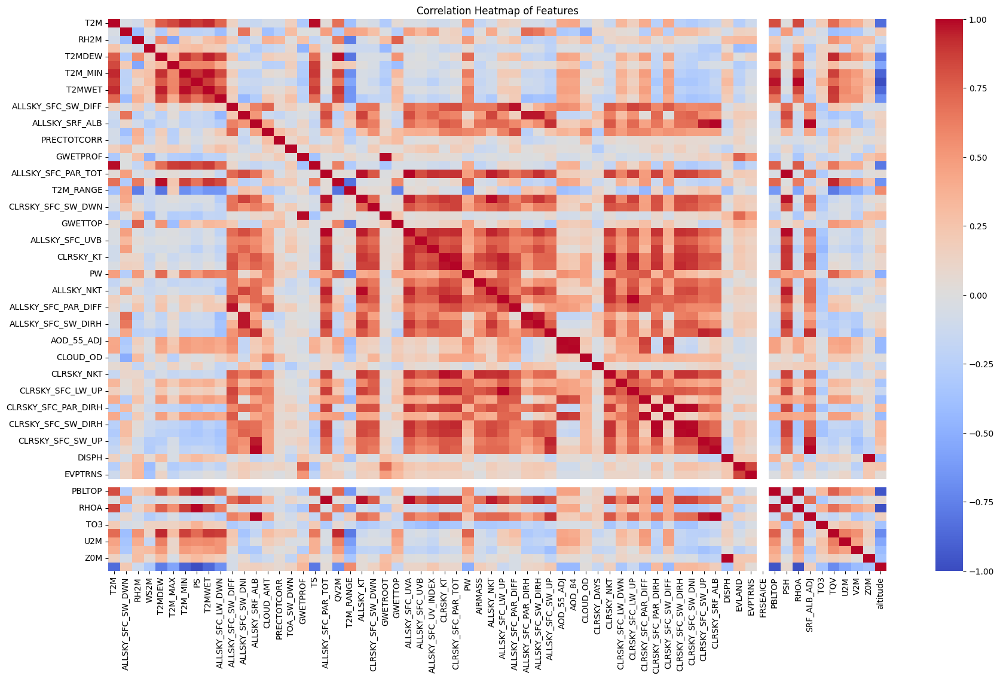

In [31]:
# Correlation Heatmap
plt.figure(figsize=(21, 12))
sns.heatmap(train_df.corr(method='pearson'), cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap of Features')
plt.show()

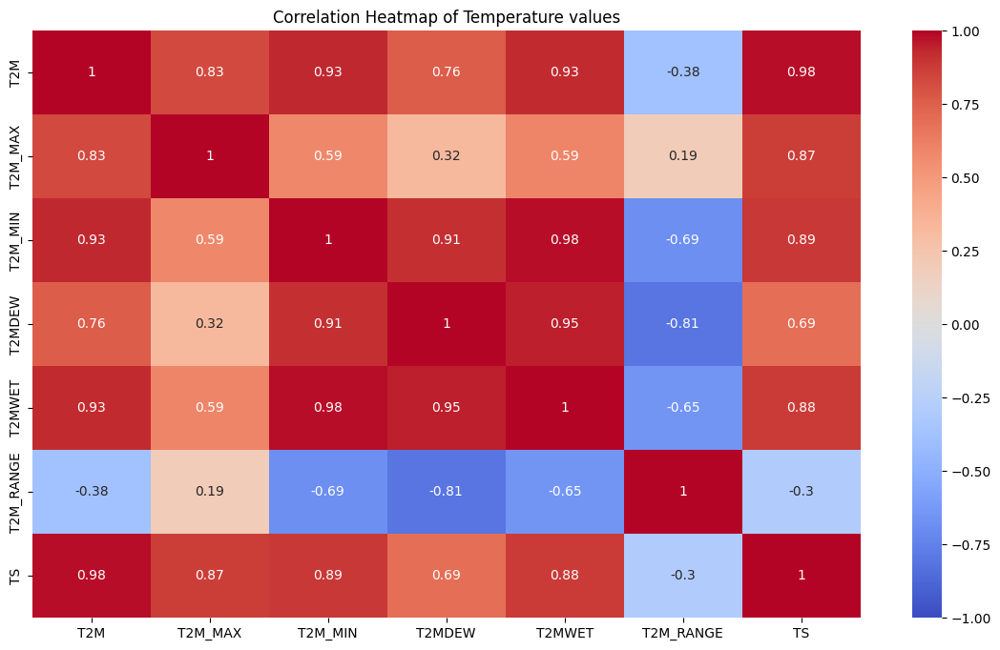

In [13]:
# Temperature Correlation Heatmap
plt.figure(figsize=(14, 8))
sns.heatmap(train_df[temperature_params].corr(method='pearson'),annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap of Temperature values')
plt.show()

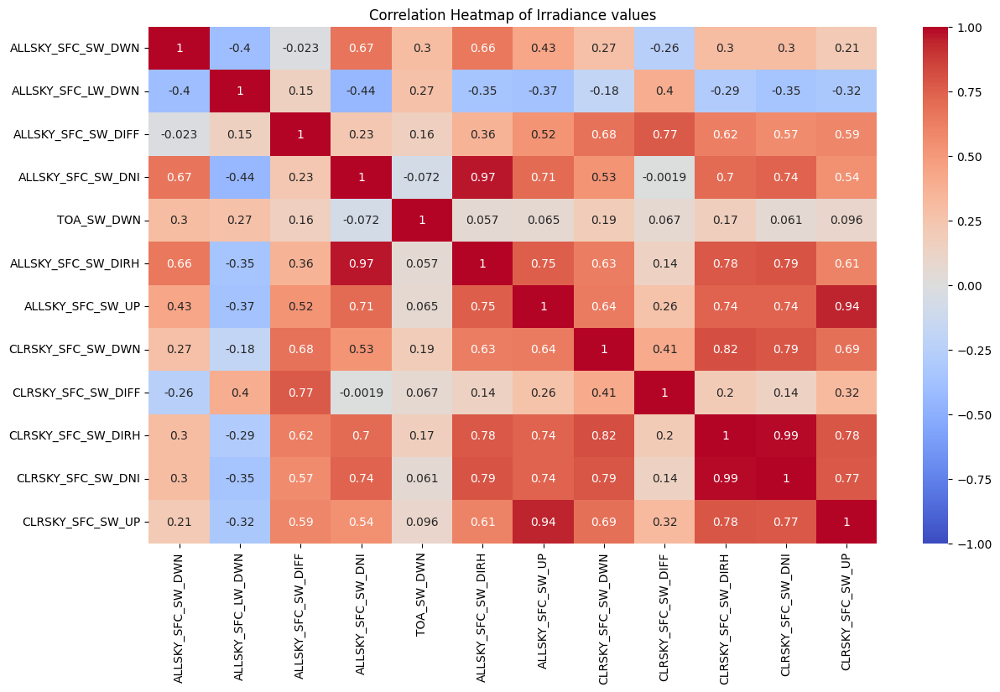

In [14]:
# irradiation correlation heatmap
plt.figure(figsize=(14, 8))
sns.heatmap(train_df[irradiance_params].corr(method='pearson'),annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap of Irradiance values')
plt.show()

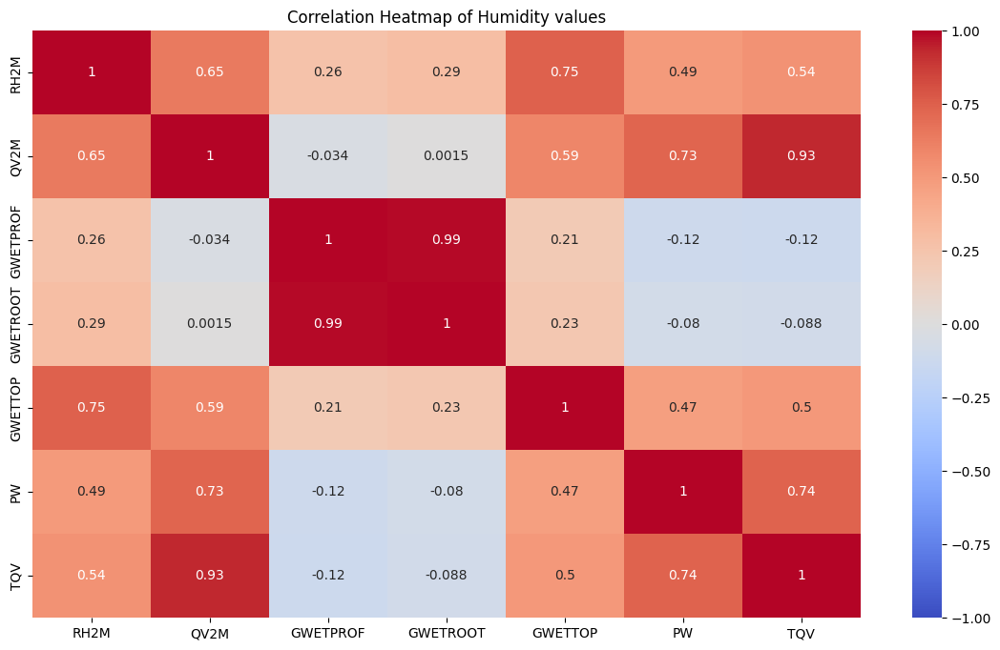

In [15]:
# humidity correlation heatmap
plt.figure(figsize=(14, 8))
sns.heatmap(train_df[humidity_params].corr(method='pearson'),annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap of Humidity values')
plt.show()

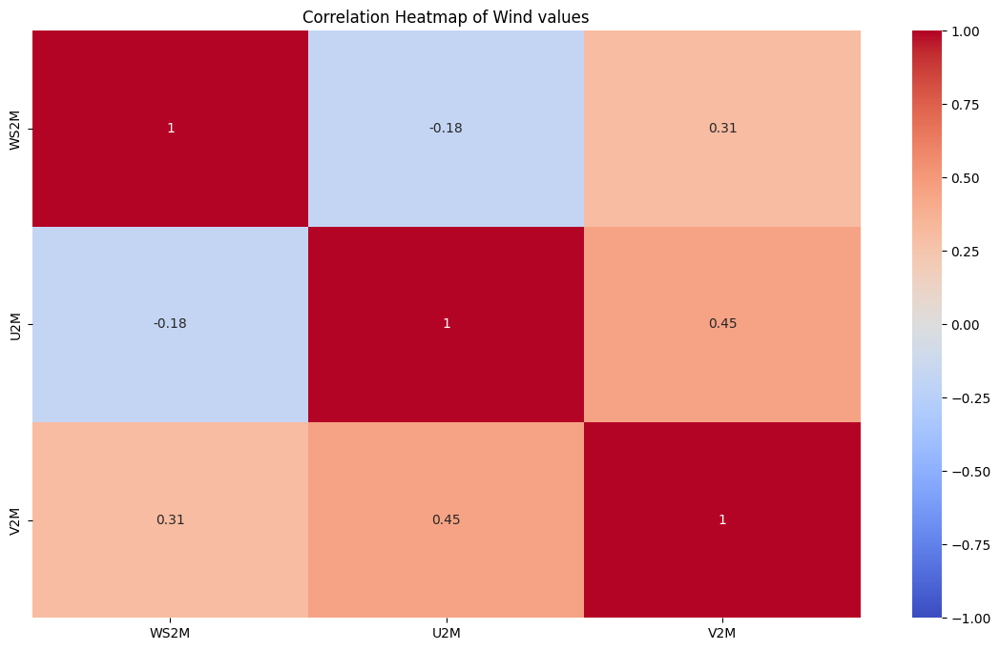

In [16]:
# wind paramters correlation
plt.figure(figsize=(14, 8))
sns.heatmap(train_df[wind_params].corr(method='pearson'),annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap of Wind values')
plt.show()

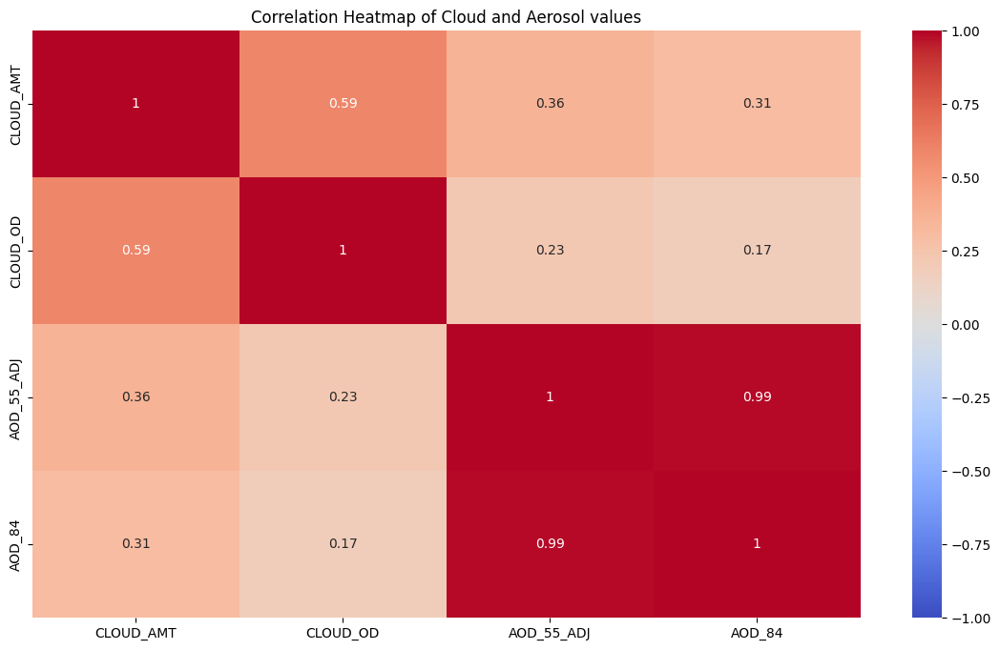

In [17]:
# Cloud and aerosol parameter correlation heatmap
plt.figure(figsize=(14, 8))
sns.heatmap(train_df[cloud_aerosol_params].corr(method='pearson'),annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap of Cloud and Aerosol values')
plt.show()

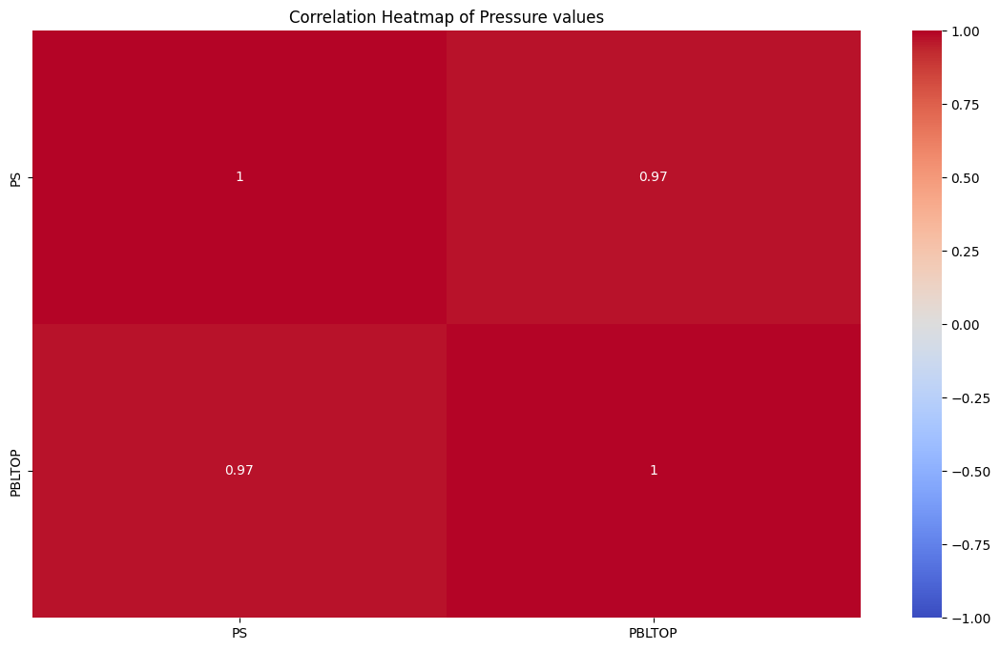

In [18]:
# Surface and Atmospheric Pressure Parameters correlation heatmap
plt.figure(figsize=(14, 8))
sns.heatmap(train_df[pressure_params].corr(method='pearson'),annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap of Pressure values')
plt.show()

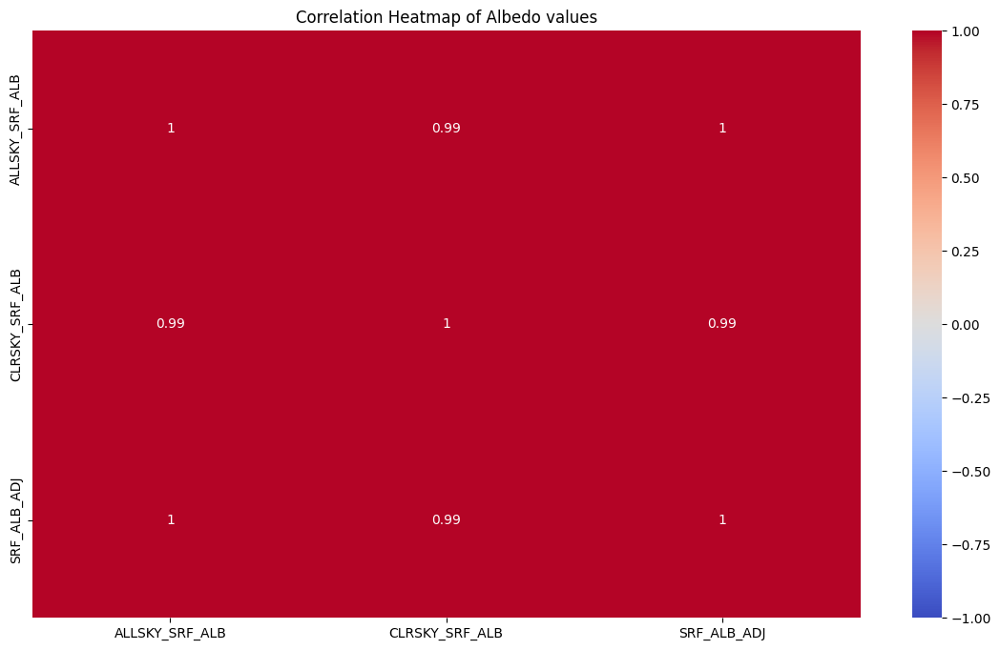

In [19]:
# Albedo parameters correlation heatmap
plt.figure(figsize=(14, 8))
sns.heatmap(train_df[albedo_params].corr(method='pearson'),annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap of Albedo values')
plt.show()

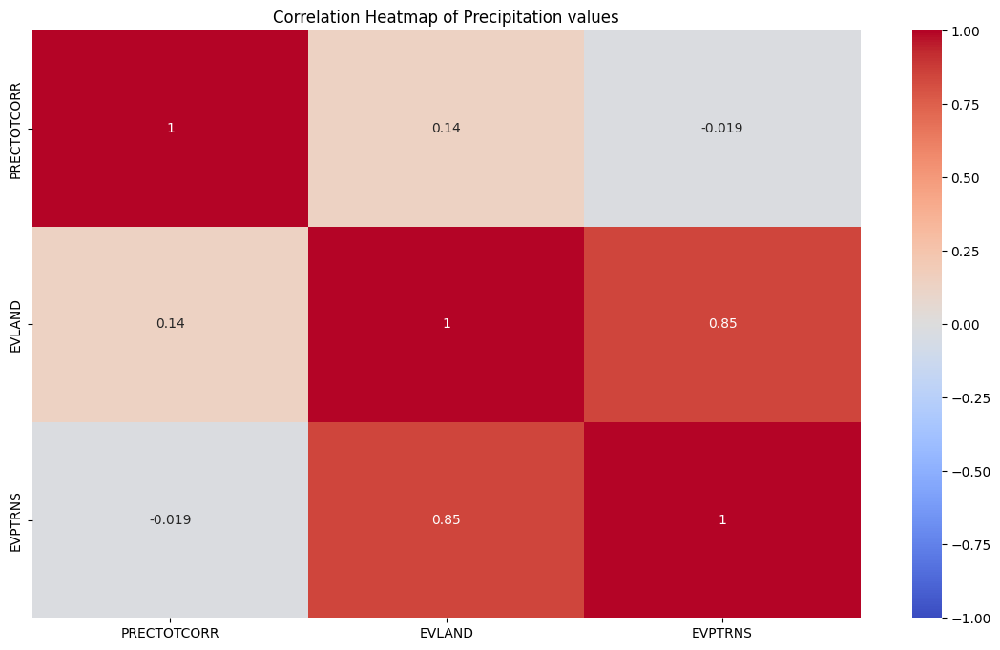

In [20]:
# precipitation correlation heatmap
plt.figure(figsize=(14, 8))
sns.heatmap(train_df[precipitation_params].corr(method='pearson'),annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap of Precipitation values')
plt.show()

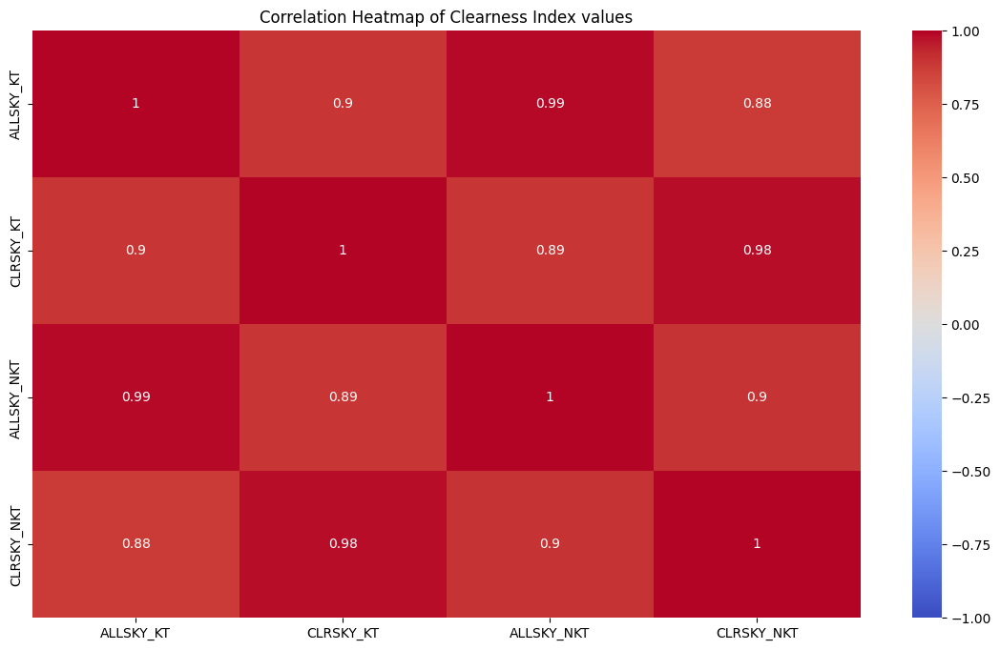

In [21]:
# clearness index correlation heatmap
plt.figure(figsize=(14, 8))
sns.heatmap(train_df[clearness_index_params].corr(method='pearson'),annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap of Clearness Index values')
plt.show()

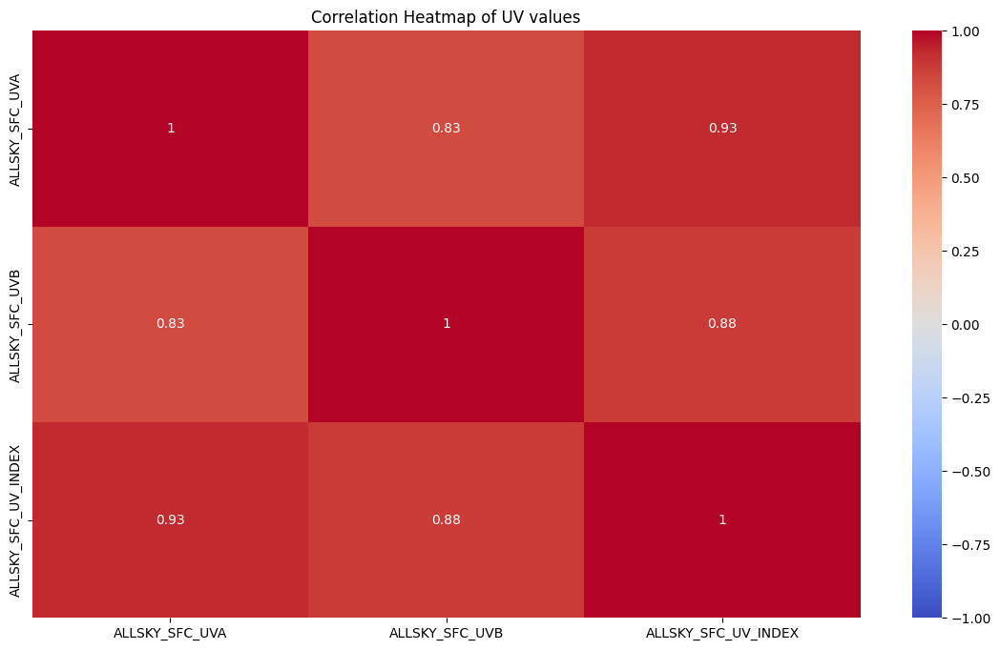

In [ ]:
# UV radiation correlation heatmap
plt.figure(figsize=(14, 8))
sns.heatmap(train_df[uv_params].corr(method='pearson'),annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap of UV values')
plt.show()

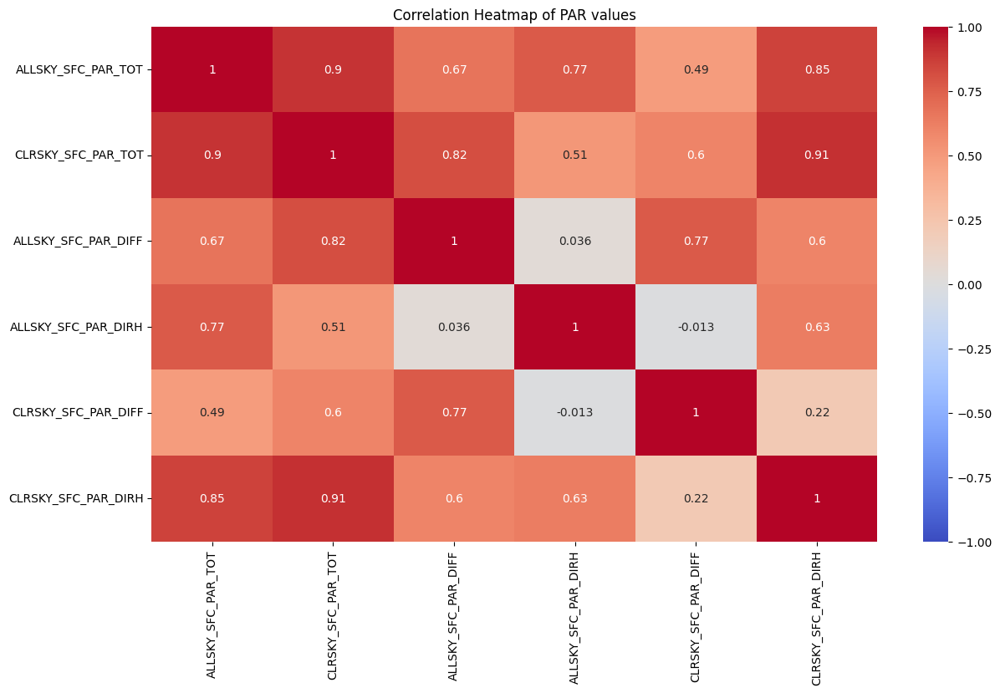

In [ ]:
# PAR parameters correlation heatmap
plt.figure(figsize=(14, 8))
sns.heatmap(train_df[par_params].corr(method='pearson'),annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap of PAR values')
plt.show()

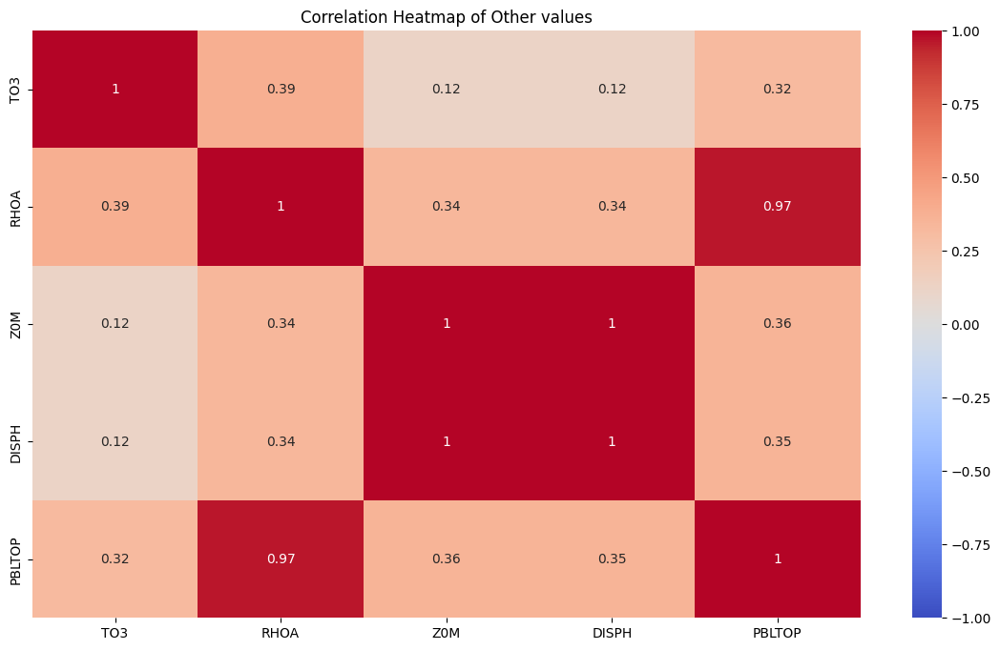

In [ ]:
# Other parameters correlation heatmap
plt.figure(figsize=(14, 8))
sns.heatmap(train_df[other_params].corr(method='pearson'),annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap of Other values')
plt.show()

## Corr cleaned

In [56]:
train_cleaned = df[cleaned_params].copy()

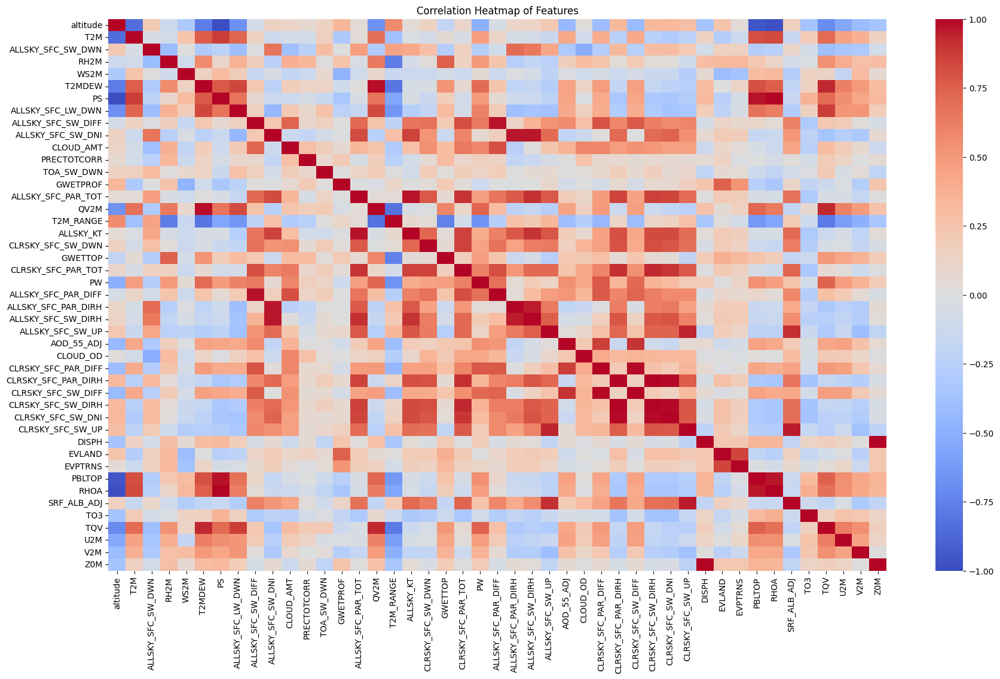

In [57]:
# Correlation Heatmap
plt.figure(figsize=(21, 12))
sns.heatmap(train_cleaned.corr(method='pearson'), cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap of Features')
plt.show()

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
# VIF Calculation
vif_data = pd.DataFrame()
vif_data['Feature'] = train_df.columns
vif_data['VIF'] = [variance_inflation_factor(train_df.values, i) for i in range(train_df.shape[1])]

/usr/local/lib/python3.11/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)
/usr/local/lib/python3.11/dist-packages/statsmodels/regression/linear_model.py:1784: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.uncentered_tss


In [ ]:
vif_data

,Feature,VIF
0,T2M,9.721829e+06
1,ALLSKY_SFC_SW_DWN,3.218949e+02
2,RH2M,2.664963e+03
3,WS2M,1.750299e+01
4,T2MDEW,5.962097e+06
...,...,...
61,TQV,1.839560e+02
62,U2M,3.451073e+00
63,V2M,2.771194e+00
64,Z0M,9.170256e+03


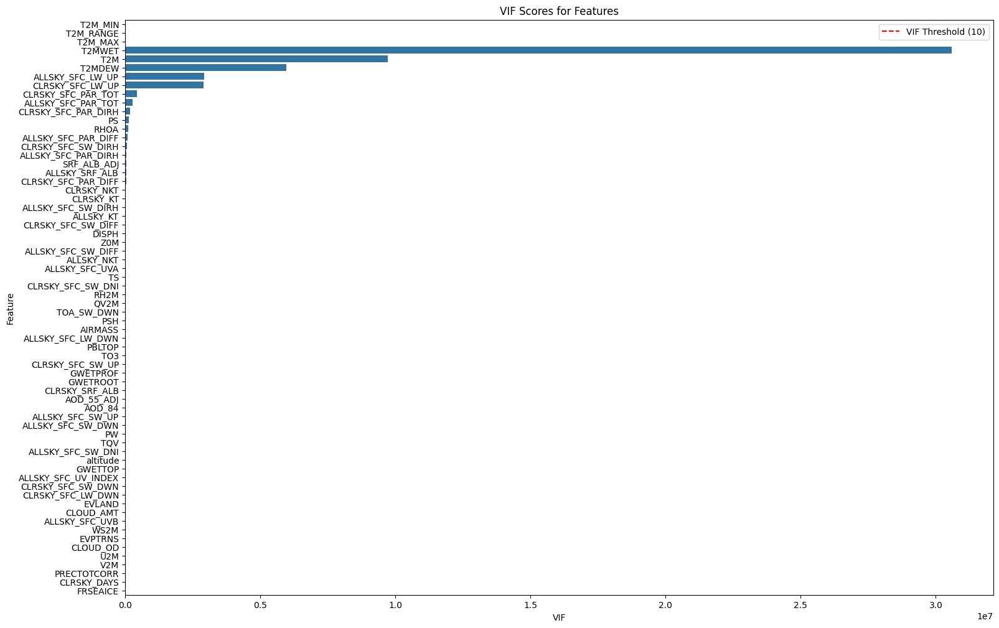

In [ ]:
plt.figure(figsize=(18, 12))
sns.barplot(x='VIF', y='Feature', data=vif_data.sort_values('VIF', ascending=False))
plt.axvline(x=10, color='red', linestyle='--', label='VIF Threshold (10)')
plt.title('VIF Scores for Features')
plt.legend()
plt.show()

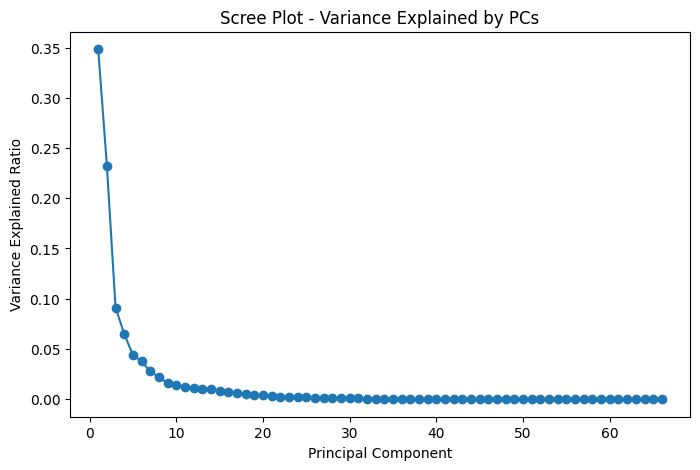

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Standardize data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(train_df)

# PCA
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Scree Plot
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_, marker='o')
plt.title('Scree Plot - Variance Explained by PCs')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained Ratio')
plt.show()

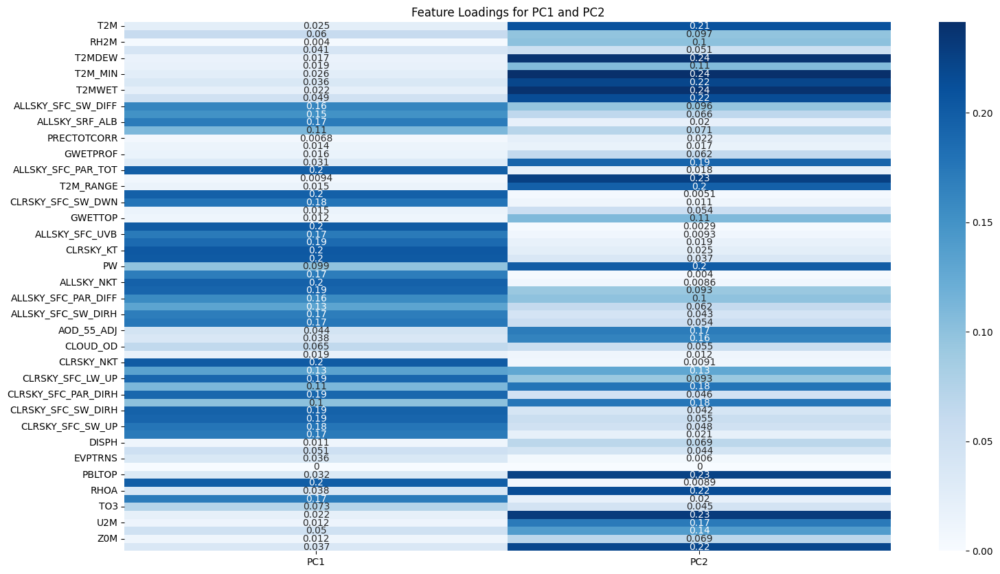

In [ ]:
# Loading Plot
loadings = pd.DataFrame(pca.components_.T, columns=[f'PC{i+1}' for i in range(len(train_df.columns))], index=train_df.columns)
plt.figure(figsize=(18, 10))
sns.heatmap(loadings[['PC1', 'PC2']].abs(), annot=True, cmap='Blues')
plt.title('Feature Loadings for PC1 and PC2')
plt.show()

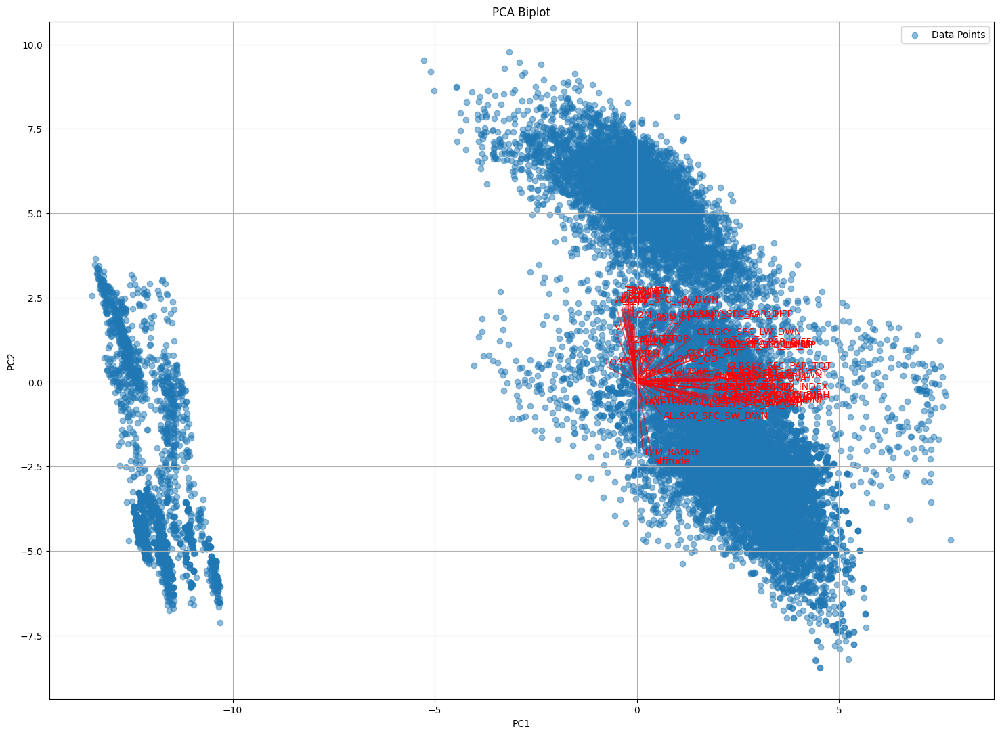

In [ ]:
# Biplot (simplified for 2 PCs)
def plot_biplot(X_pca, loadings, feature_names):
    plt.figure(figsize=(18, 13))
    plt.scatter(X_pca[:, 0], X_pca[:, 1], alpha=0.5, label='Data Points')
    scale = 10  # Scale arrows for visibility
    for i, feature in enumerate(feature_names):
        plt.arrow(0, 0, loadings.iloc[i, 0] * scale, loadings.iloc[i, 1] * scale, color='r', alpha=0.5)
        plt.text(loadings.iloc[i, 0] * scale * 1.1, loadings.iloc[i, 1] * scale * 1.1, feature, color='r')
    plt.xlabel('PC1')
    plt.ylabel('PC2')
    plt.title('PCA Biplot')
    plt.grid(True)
    plt.legend()
    plt.show()

plot_biplot(X_pca, loadings, train_df.columns)

In [ ]:
from scipy.cluster import hierarchy
from scipy.spatial.distance import squareform
import seaborn as sns

# Correlation-based distance
corr_matrix = train_df.corr(method='spearman')  # Spearman for non-linear relationships
dist_matrix = 1 - np.abs(corr_matrix)
condensed_dist = squareform(dist_matrix)

# Clustered Heatmap
sns.clustermap(corr_matrix, cmap='coolwarm', vmin=-1, vmax=1, annot=True)
plt.title('Clustered Correlation Heatmap')
plt.show()

ValueError: Distance matrix 'X' must be symmetric.

In [ ]:
from scipy.cluster import hierarchy
from scipy.spatial.distance import squareform
import seaborn as sns
import numpy as np

# Handle Missing Values (Imputation - fill with the mean)
# Replace this with other imputation strategies if needed
for col in train_df.columns:
    if train_df[col].isnull().any():  # Check for missing values in each column
        train_df[col] = train_df[col].fillna(train_df[col].mean())

# Ensure Data Type (Convert to float64)
train_df = train_df.astype(np.float64)

# Correlation-based distance
corr_matrix = train_df.corr(method='spearman')  # Spearman for non-linear relationships
dist_matrix = 1 - np.abs(corr_matrix)
condensed_dist = squareform(dist_matrix)

# Clustered Heatmap
sns.clustermap(corr_matrix, cmap='coolwarm', vmin=-1, vmax=1, annot=True)
plt.title('Clustered Correlation Heatmap')
plt.show()

ValueError: Distance matrix 'X' must be symmetric.

In [ ]:
# Dendrogram
linkage = hierarchy.linkage(condensed_dist, method='average')
plt.figure(figsize=(12, 6))
dendro = hierarchy.dendrogram(linkage, labels=train_df.columns, leaf_rotation=90)
plt.title('Feature Clustering Dendrogram')
plt.xlabel('Features')
plt.ylabel('Distance')
plt.axhline(y=0.3, color='red', linestyle='--', label='Cluster Threshold (0.3)')
plt.legend()
plt.show()

# Pairplot for a suspected cluster (e.g., temperature features)
suspected_cluster = ['T2M', 'T2M_MAX', 'T2M_MIN', 'T2MDEW']
sns.pairplot(train_df[suspected_cluster])
plt.suptitle('Pairplot of Temperature-Related Features', y=1.02)
plt.show()

# Clustering
clusters = hierarchy.fcluster(linkage, t=0.3, criterion='distance')
cluster_df = pd.DataFrame({'Feature': train_df.columns, 'Cluster': clusters})
print(cluster_df.groupby('Cluster').agg(list))

# Working with Soroti

In [ ]:
soroti

,datetime,ghi,location,T2M,ALLSKY_SFC_SW_DWN,RH2M,WS2M,T2MDEW,T2M_MAX,T2M_MIN,...,RHOA,SRF_ALB_ADJ,TO3,TQV,U2M,V2M,Z0M,altitude,error,sq_error
datetime,,,,,,,,,,,,,,,,,,,,,
2020-02-01,2020-02-01,2.55,soroti,21.09,3.85,79.84,1.47,17.25,24.69,18.62,...,1.05,0.14,242.09,38.62,-0.02,-0.65,0.04,1090.0,-1.30,-1.6900
2020-02-02,2020-02-02,6.10,soroti,22.60,6.09,68.88,1.12,16.36,26.61,17.73,...,1.05,0.14,245.10,36.57,-0.63,-0.57,0.04,1090.0,0.01,0.0001
2020-02-03,2020-02-03,4.69,soroti,23.45,4.52,73.88,1.26,18.32,27.64,18.56,...,1.04,0.14,244.38,40.83,-0.21,-1.06,0.04,1090.0,0.17,0.0289
2020-02-04,2020-02-04,6.69,soroti,23.67,6.58,75.86,1.02,18.77,28.71,19.00,...,1.04,0.13,244.86,37.65,-0.40,0.21,0.04,1090.0,0.11,0.0121
2020-02-05,2020-02-05,6.03,soroti,23.87,6.27,75.49,1.06,18.89,28.40,19.90,...,1.04,0.14,242.93,40.12,-0.70,0.33,0.04,1090.0,-0.24,-0.0576
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-27,2021-12-27,6.24,soroti,27.24,6.50,46.24,2.64,13.20,35.23,20.37,...,1.03,0.13,242.46,30.68,-2.49,-0.81,0.05,1090.0,-0.26,-0.0676
2021-12-28,2021-12-28,5.21,soroti,26.54,5.46,53.13,1.16,15.52,32.68,20.42,...,1.03,0.16,243.44,34.04,-1.05,0.09,0.05,1090.0,-0.25,-0.0625
2021-12-29,2021-12-29,6.83,soroti,25.94,5.68,57.77,2.26,16.07,32.68,21.30,...,1.03,0.13,240.45,34.81,-1.06,0.85,0.05,1090.0,1.15,1.3225


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import f_regression, mutual_info_regression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.inspection import permutation_importance
from sklearn.neural_network import MLPRegressor
import shap
import numpy as np

width = 8
height = 15
def run_feature_importance_eda(df, parameters_array, target_col='error', verbose=True):

    locations = df['location'].unique()

    all_location_features = {}

    for location in locations:
        location_df = df[df['location'] == location].copy()

        if len(location_df) < 10:  # Skip if too few samples
            print(f"Skipping {location} - insufficient data points ({len(location_df)})")
            continue

        train_df = location_df[parameters_array].copy()
        target_df = location_df[[target_col]]
        y = target_df[target_col]

        # Scale for models that need it
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(train_df)

        important_features = {}

        ### 1. OLS P-values ###
        X_sm = sm.add_constant(train_df)
        ols_model = sm.OLS(y, X_sm).fit()
        ols_pvalues = ols_model.pvalues.drop('const')
        significant_features = ols_pvalues[ols_pvalues < 0.07].sort_values()
        important_features['OLS_pvalue'] = significant_features.index.tolist()

        if verbose:
            plt.figure(figsize=(height, width))
            bars = plt.barh(significant_features.index, significant_features.values)
            plt.xlabel('p-value')
            plt.title(f'OLS - p-value < 0.07 ({location})')
            plt.show()

        ### 2. ANOVA F-test ###
        f_scores, p_values = f_regression(X_scaled, y)
        anova_df = pd.DataFrame({'Feature': train_df.columns, 'F_Score': f_scores, 'p_value': p_values})
        anova_df = anova_df.sort_values('F_Score', ascending=False)
        important_features['ANOVA_F'] = anova_df[anova_df['p_value'] < 0.06]['Feature'].tolist()

        if verbose:
            plt.figure(figsize=(height, width))
            bars = plt.barh(anova_df.head(20)['Feature'], anova_df.head(20)['F_Score'])
            plt.xlabel('F-Score')
            plt.title(f'Top 20 Features by ANOVA F-score ({location})')
            plt.show()

        ### 3. Random Forest ###
        rf = RandomForestRegressor(n_estimators=100, random_state=42)
        rf.fit(train_df, y)
        rf_importances = pd.Series(rf.feature_importances_, index=train_df.columns).sort_values(ascending=False)
        important_features['RandomForest'] = rf_importances.head(20).index.tolist()

        if verbose:
            plt.figure(figsize=(height, width))
            bars = plt.barh(rf_importances.head(20).index, rf_importances.head(20).values)
            plt.xlabel('Relative Importance')
            plt.title(f'Random Forest Feature Importances ({location})')
            plt.show()

        ### 4. XGBoost ###
        xgb = XGBRegressor(n_estimators=100, learning_rate=0.1)
        xgb.fit(train_df, y)
        xgb_importances = pd.Series(xgb.feature_importances_, index=train_df.columns).sort_values(ascending=False)
        important_features['XGBoost'] = xgb_importances.head(20).index.tolist()

        if verbose:
            plt.figure(figsize=(height, width))
            bars = plt.barh(xgb_importances.head(20).index, xgb_importances.head(20).values)
            plt.xlabel('Relative Importance')
            plt.title(f'XGBoost Feature Importances ({location})')
            plt.show()

        ### 5. Mutual Information ###
        mi = mutual_info_regression(train_df, y)
        mi_series = pd.Series(mi, index=train_df.columns).sort_values(ascending=False)
        important_features['MutualInfo'] = mi_series.head(15).index.tolist()

        if verbose:
            plt.figure(figsize=(height, width))
            bars = plt.barh(mi_series.head(15).index, mi_series.head(15).values)
            plt.xlabel('Mutual Info Score')
            plt.title(f'Mutual Information ({location})')
            plt.show()

        ### 6. Permutation Importance (on RF) ###
        perm = permutation_importance(rf, train_df, y, n_repeats=10, random_state=42)
        perm_sorted = pd.Series(perm.importances_mean, index=train_df.columns).sort_values(ascending=False)
        important_features['Permutation'] = perm_sorted.head(15).index.tolist()

        if verbose:
            plt.figure(figsize=(height, width))
            bars = plt.barh(perm_sorted.head(15).index, perm_sorted.head(15).values)
            plt.xlabel('Permutation Importance')
            plt.title(f'Permutation Importance (Random Forest) ({location})')
            plt.show()

        ### 7. SHAP (XGBoost and MLP) ###
        try:
            # Tree-based
            explainer_xgb = shap.Explainer(xgb)
            shap_values_xgb = explainer_xgb(train_df)
            important_features['SHAP_XGB'] = train_df.columns[np.abs(shap_values_xgb.values).mean(0).argsort()[::-1][:15]].tolist()

            if verbose:
                shap.summary_plot(shap_values_xgb, train_df, plot_type='bar', plot_size=(height, width),
                                title=f'SHAP XGBoost ({location})')

        except Exception as e:
            print(f"SHAP failed for {location}: {e}")

        # Store results for this location
        all_location_features[location] = important_features

    return all_location_features

In [ ]:
def run_feature_importance_entire_eda(df, parameters_array, target_col='error', verbose=True):

    train_df = df[parameters_array].copy()
    target_df = df[[target_col]]
    y = target_df[target_col]

    location = 'all_locations'
    # Scale for models that need it
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(train_df)

    important_features = {}

    ### 1. OLS P-values ###
    X_sm = sm.add_constant(train_df)
    ols_model = sm.OLS(y, X_sm).fit()
    ols_pvalues = ols_model.pvalues.drop('const')
    significant_features = ols_pvalues[ols_pvalues < 0.07].sort_values()
    important_features['OLS_pvalue'] = significant_features.index.tolist()

    if verbose:
        plt.figure(figsize=(height, width)) # Assuming height and width are defined elsewhere
        bars = plt.barh(significant_features.index, significant_features.values)
        plt.xlabel('p-value')
        plt.title(f'OLS - p-value < 0.07 ({location})')
        plt.show()

    ### 2. ANOVA F-test ###
    f_scores, p_values = f_regression(X_scaled, y)
    anova_df = pd.DataFrame({'Feature': train_df.columns, 'F_Score': f_scores, 'p_value': p_values})
    anova_df = anova_df.sort_values('F_Score', ascending=False)
    important_features['ANOVA_F'] = anova_df[anova_df['p_value'] < 0.06]['Feature'].tolist()

    if verbose:
        plt.figure(figsize=(height, width)) # Assuming height and width are defined elsewhere
        bars = plt.barh(anova_df.head(20)['Feature'], anova_df.head(20)['F_Score'])
        plt.xlabel('F-Score')
        plt.title(f'Top 20 Features by ANOVA F-score ({location})')
        plt.show()

    ### 3. Random Forest ###
    rf = RandomForestRegressor(n_estimators=100, random_state=42)
    rf.fit(train_df, y)
    rf_importances = pd.Series(rf.feature_importances_, index=train_df.columns).sort_values(ascending=False)
    important_features['RandomForest'] = rf_importances.head(20).index.tolist()

    if verbose:
        plt.figure(figsize=(height, width)) # Assuming height and width are defined elsewhere
        bars = plt.barh(rf_importances.head(20).index, rf_importances.head(20).values)
        plt.xlabel('Relative Importance')
        plt.title(f'Random Forest Feature Importances ({location})')
        plt.show()

    ### 4. XGBoost ###
    xgb = XGBRegressor(n_estimators=100, learning_rate=0.1)
    xgb.fit(train_df, y)
    xgb_importances = pd.Series(xgb.feature_importances_, index=train_df.columns).sort_values(ascending=False)
    important_features['XGBoost'] = xgb_importances.head(20).index.tolist()

    if verbose:
        plt.figure(figsize=(height, width)) # Assuming height and width are defined elsewhere
        bars = plt.barh(xgb_importances.head(20).index, xgb_importances.head(20).values)
        plt.xlabel('Relative Importance')
        plt.title(f'XGBoost Feature Importances ({location})')
        plt.show()

    ### 5. Mutual Information ###
    mi = mutual_info_regression(train_df, y)
    mi_series = pd.Series(mi, index=train_df.columns).sort_values(ascending=False)
    important_features['MutualInfo'] = mi_series.head(15).index.tolist()

    if verbose:
        plt.figure(figsize=(height, width)) # Assuming height and width are defined elsewhere
        bars = plt.barh(mi_series.head(15).index, mi_series.head(15).values)
        plt.xlabel('Mutual Info Score')
        plt.title(f'Mutual Information ({location})')
        plt.show()

    ### 6. Permutation Importance (on RF) ###
    perm = permutation_importance(rf, train_df, y, n_repeats=10, random_state=42)
    perm_sorted = pd.Series(perm.importances_mean, index=train_df.columns).sort_values(ascending=False)
    important_features['Permutation'] = perm_sorted.head(15).index.tolist()

    if verbose:
        plt.figure(figsize=(height, width)) # Assuming height and width are defined elsewhere
        bars = plt.barh(perm_sorted.head(15).index, perm_sorted.head(15).values)
        plt.xlabel('Permutation Importance')
        plt.title(f'Permutation Importance (Random Forest) ({location})')
        plt.show()

    ### 7. SHAP (XGBoost and MLP) ###
    try:
        # Tree-based
        explainer_xgb = shap.Explainer(xgb)
        shap_values_xgb = explainer_xgb(train_df)
        important_features['SHAP_XGB'] = train_df.columns[np.abs(shap_values_xgb.values).mean(0).argsort()[::-1][:15]].tolist()

        if verbose:
            shap.summary_plot(shap_values_xgb, train_df, plot_type='bar', plot_size=(height, width), # Assuming height and width are defined elsewhere
                            title=f'SHAP XGBoost ({location})')

    except Exception as e:
        print(f"SHAP failed for {location}: {e}")

    return important_features, ols_model

def plot_feature_frequency_entire(feature_dict, top_n=None):
    # Flatten and count frequency
    all_features = sum(feature_dict.values(), [])
    feature_counts = Counter(all_features)
    freq_df = pd.DataFrame.from_dict(feature_counts, orient='index', columns=['count'])
    freq_df = freq_df.sort_values(by='count', ascending=False)
    freq_df.index.name = 'feature'
    freq_df.reset_index(inplace=True)

    # Plot
    plt.figure(figsize=(14, 8))
    sns.barplot(data=freq_df.head(top_n) if top_n else freq_df, x='count', y='feature', palette='viridis')
    plt.title(f'Feature Frequency Across Importance Methods')
    plt.xlabel('Number of Methods Selected')
    plt.ylabel('Feature Name')
    plt.grid(True, axis='x', linestyle='--')
    plt.show()

    return freq_df

def plot_feature_method_matrix_entire(feature_dict):
    all_methods = list(feature_dict.keys())
    all_features = set(sum(feature_dict.values(), []))

    matrix_df = pd.DataFrame(0, index=sorted(all_features), columns=all_methods)

    for method, features in feature_dict.items():
        for feat in features:
            matrix_df.loc[feat, method] = 1

    plt.figure(figsize=(14, max(6, len(matrix_df) * 0.3)))
    sns.heatmap(matrix_df, annot=True, cmap='YlGnBu', cbar=False, linewidths=0.5)
    plt.title("Feature Inclusion Across Methods")
    plt.xlabel("Method")
    plt.ylabel("Feature")
    plt.tight_layout()
    plt.show()

    return matrix_df

def categorize_features_by_frequency_entire(freq_df):
    strong = freq_df[freq_df['count'] >= 5]['feature'].tolist()
    moderate = freq_df[(freq_df['count'] >= 3) & (freq_df['count'] < 5)]['feature'].tolist()
    weak = freq_df[freq_df['count'] < 3]['feature'].tolist()

    return {'strong': strong, 'moderate': moderate, 'weak': weak}

In [ ]:
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

def plot_feature_frequency(feature_dict, top_n=None):
    # Create a figure with subplots for each location
    locations = list(feature_dict.keys())
    fig, axes = plt.subplots(len(locations), 1, figsize=(14, 8*len(locations)),
                           squeeze=False)

    all_freq_dfs = {}

    for idx, location in enumerate(locations):
        # Flatten and count frequency for this location
        all_features = sum(feature_dict[location].values(), [])
        feature_counts = Counter(all_features)
        freq_df = pd.DataFrame.from_dict(feature_counts, orient='index', columns=['count'])
        freq_df = freq_df.sort_values(by='count', ascending=False)
        freq_df.index.name = 'feature'
        freq_df.reset_index(inplace=True)

        # Plot for this location
        ax = axes[idx, 0]
        sns.barplot(data=freq_df.head(top_n) if top_n else freq_df,
                   x='count', y='feature', hue='feature', palette='viridis',
                    legend=False, ax=ax)
        ax.set_title(f'Feature Frequency Across Importance Methods - {location}')
        ax.set_xlabel('Number of Methods Selected')
        ax.set_ylabel('Feature Name')
        ax.grid(True, axis='x', linestyle='--')

        all_freq_dfs[location] = freq_df

    plt.tight_layout()
    plt.show()

    return all_freq_dfs

def plot_feature_method_matrix(feature_dict):
    locations = list(feature_dict.keys())
    fig, axes = plt.subplots(len(locations), 1, figsize=(14, max(6, sum(len(set(sum(feature_dict[loc].values(), []))) * 0.3 for loc in locations))),
                           squeeze=False)

    all_matrix_dfs = {}

    for idx, location in enumerate(locations):
        all_methods = list(feature_dict[location].keys())
        all_features = set(sum(feature_dict[location].values(), []))

        matrix_df = pd.DataFrame(0, index=sorted(all_features), columns=all_methods)

        for method, features in feature_dict[location].items():
            for feat in features:
                matrix_df.loc[feat, method] = 1

        # Plot for this location
        ax = axes[idx, 0]
        sns.heatmap(matrix_df, annot=True, cmap='YlGnBu', cbar=False,
                   linewidths=0.5, ax=ax)
        ax.set_title(f"Feature Inclusion Across Methods - {location}")
        ax.set_xlabel("Method")
        ax.set_ylabel("Feature")

        all_matrix_dfs[location] = matrix_df

    plt.tight_layout()
    plt.show()

    return all_matrix_dfs

def categorize_features_by_frequency(freq_df_dict):
    categorized_features = {}

    for location, freq_df in freq_df_dict.items():
        strong = freq_df[freq_df['count'] >= 5]['feature'].tolist()
        moderate = freq_df[(freq_df['count'] >= 3) & (freq_df['count'] < 5)]['feature'].tolist()
        weak = freq_df[freq_df['count'] < 3]['feature'].tolist()

        categorized_features[location] = {
            'strong': strong,
            'moderate': moderate,
            'weak': weak
        }

    return categorized_features


In [ ]:
train_df = df[parameters_array].copy()
y =  df['error']
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(train_df, y)

RandomForestRegressor(random_state=42)

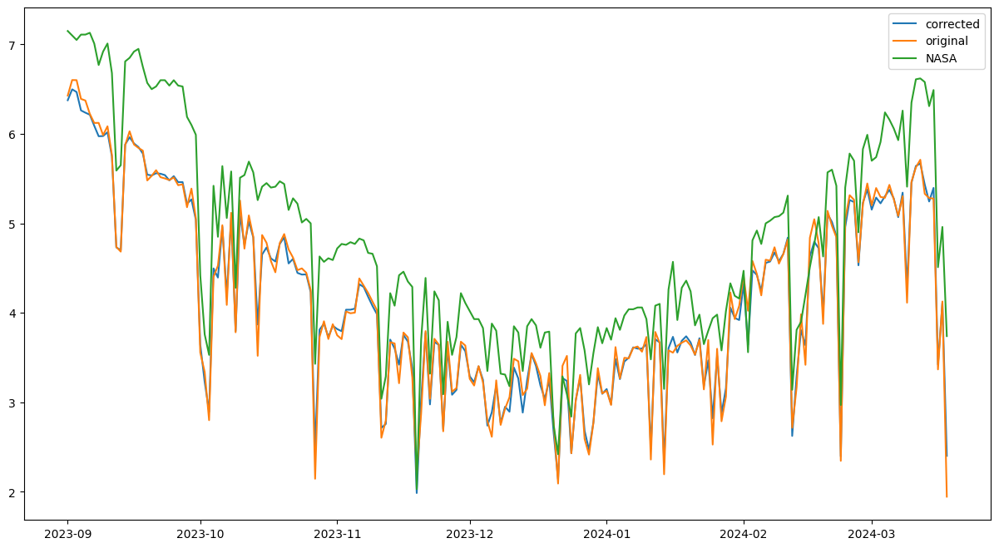

In [ ]:
prediction = rf.predict(train_df)
ghi_corrected = prediction + df['ALLSKY_SFC_SW_DWN']

plt.figure(figsize=(height, width))
plt.plot(ghi_corrected[:200], label='corrected')
plt.plot(df['ghi'][:200], label='original')
plt.plot(df['ALLSKY_SFC_SW_DWN'][:200], label='NASA')
plt.legend()
plt.show()

In [ ]:
#@title Entire dataset
all_locations_important_features, ols_model = run_feature_importance_entire_eda(df, parameters_array, target_col='error', verbose=False)

KeyboardInterrupt: 

In [ ]:
df

,datetime,ghi,location,T2M,ALLSKY_SFC_SW_DWN,RH2M,WS2M,T2MDEW,T2M_MAX,T2M_MIN,...,RHOA,SRF_ALB_ADJ,TO3,TQV,U2M,V2M,Z0M,altitude,error,sq_error
datetime,,,,,,,,,,,,,,,,,,,,,
2023-09-01,2023-09-01,6.4281,egypt_location1,29.35,7.15,59.34,4.30,19.29,36.33,24.42,...,1.14,0.36,283.56,28.08,-0.46,-4.25,0.01,110.0,-0.7219,-0.5211
2023-09-02,2023-09-02,6.6018,egypt_location1,28.94,7.10,54.39,3.97,17.31,36.27,22.82,...,1.15,0.36,278.52,26.49,-0.11,-3.93,0.01,110.0,-0.4982,-0.2482
2023-09-03,2023-09-03,6.6006,egypt_location1,28.55,7.05,54.41,3.74,17.12,34.62,23.46,...,1.15,0.36,282.32,22.75,0.42,-3.61,0.01,110.0,-0.4494,-0.2020
2023-09-04,2023-09-04,6.3911,egypt_location1,28.37,7.11,50.16,1.61,15.61,33.97,22.60,...,1.14,0.36,283.53,21.21,0.66,-1.31,0.01,110.0,-0.7189,-0.5168
2023-09-05,2023-09-05,6.3730,egypt_location1,30.54,7.11,36.23,0.94,12.53,36.72,24.05,...,1.13,0.36,282.76,19.28,-0.19,-0.14,0.01,110.0,-0.7370,-0.5432
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-27,2021-12-27,5.5400,wadelai,26.15,5.62,60.20,2.06,16.81,33.46,19.48,...,1.05,0.14,242.21,34.24,-0.96,-0.91,0.07,642.0,-0.0800,-0.0064
2021-12-28,2021-12-28,6.5000,wadelai,26.20,5.92,64.58,2.11,18.18,32.58,21.13,...,1.05,0.14,242.68,35.45,-0.63,-1.26,0.07,642.0,0.5800,0.3364
2021-12-29,2021-12-29,6.2400,wadelai,24.92,6.03,64.94,2.28,17.29,30.71,20.64,...,1.05,0.14,240.63,37.50,-0.22,-2.04,0.07,642.0,0.2100,0.0441


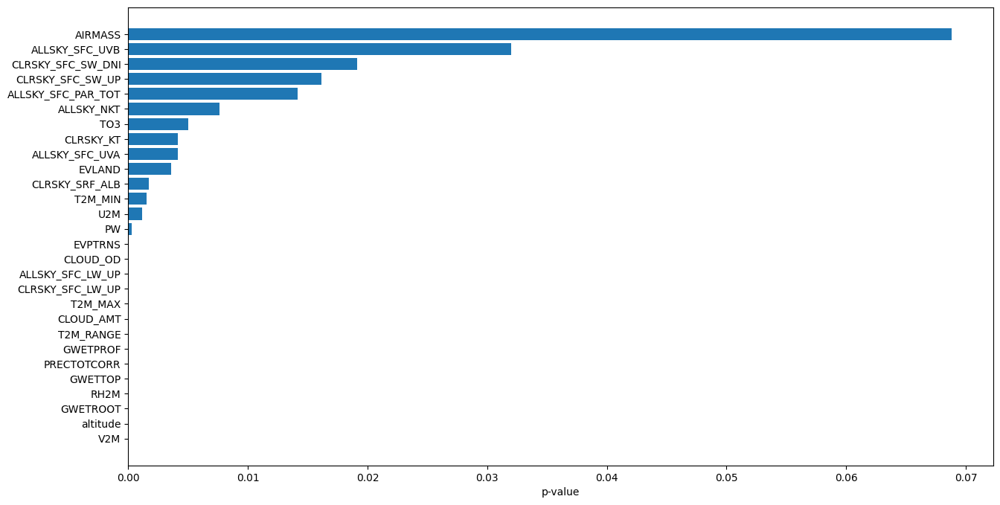

In [ ]:
train_df = df[parameters_array].copy()
y =  df['error']

important_features = {}

### 1. OLS P-values ###
X_sm = sm.add_constant(train_df)
ols_model = sm.OLS(y, X_sm).fit()
ols_pvalues = ols_model.pvalues.drop('const')
significant_features = ols_pvalues[ols_pvalues < 0.07].sort_values()
important_features['OLS_pvalue'] = significant_features.index.tolist()

if True:
    plt.figure(figsize=(height, width)) # Assuming height and width are defined elsewhere
    bars = plt.barh(significant_features.index, significant_features.values)
    plt.xlabel('p-value')
    # plt.title(f'OLS - p-value < 0.07 ({location})')
    plt.show()

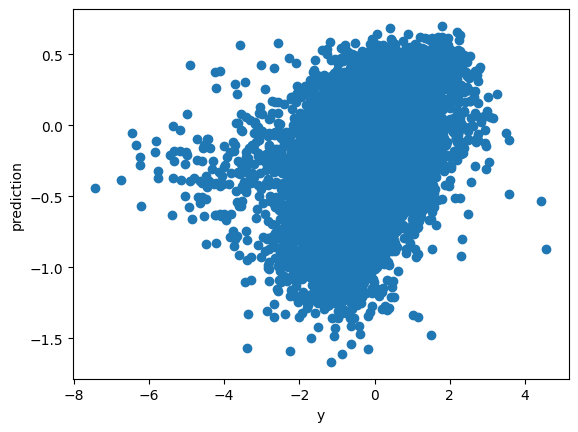

In [ ]:
prediction = ols_model.predict(X_sm)

# plot y agaist the prediction
plt.scatter(y, prediction)
plt.xlabel('y')
plt.ylabel('prediction')
plt.show()

In [ ]:
ghi_corrected = prediction + df['ALLSKY_SFC_SW_DWN']

plt.plot(ghi_corrected[:200], label='corrected')
plt.plot(df['ghi'][:200], label='original')
plt.plot(df['ALLSKY_SFC_SW_DWN'][:200], label='NASA')
plt.legend()
plt.show()

<ipython-input-18-2a4d59fc056a>:118: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=freq_df.head(top_n) if top_n else freq_df, x='count', y='feature', palette='viridis')


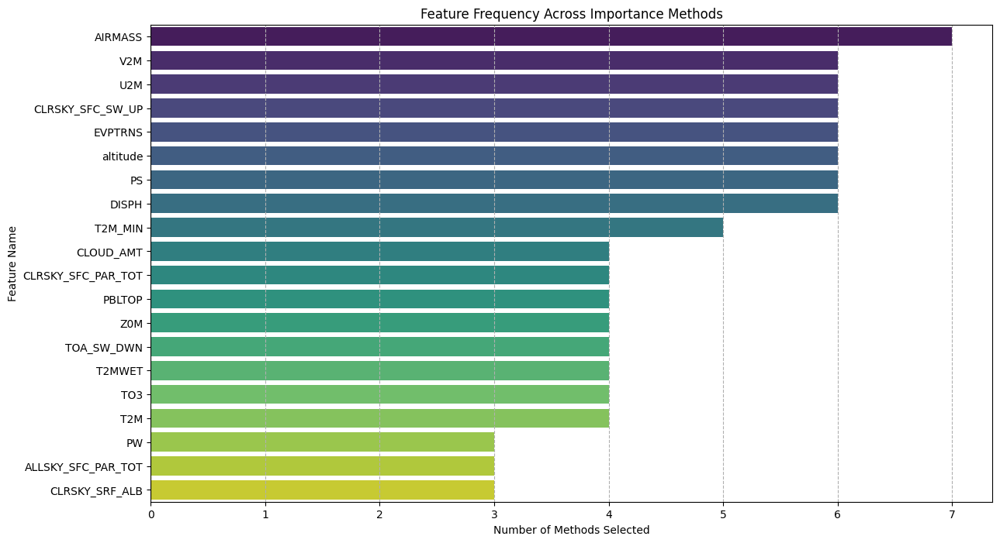

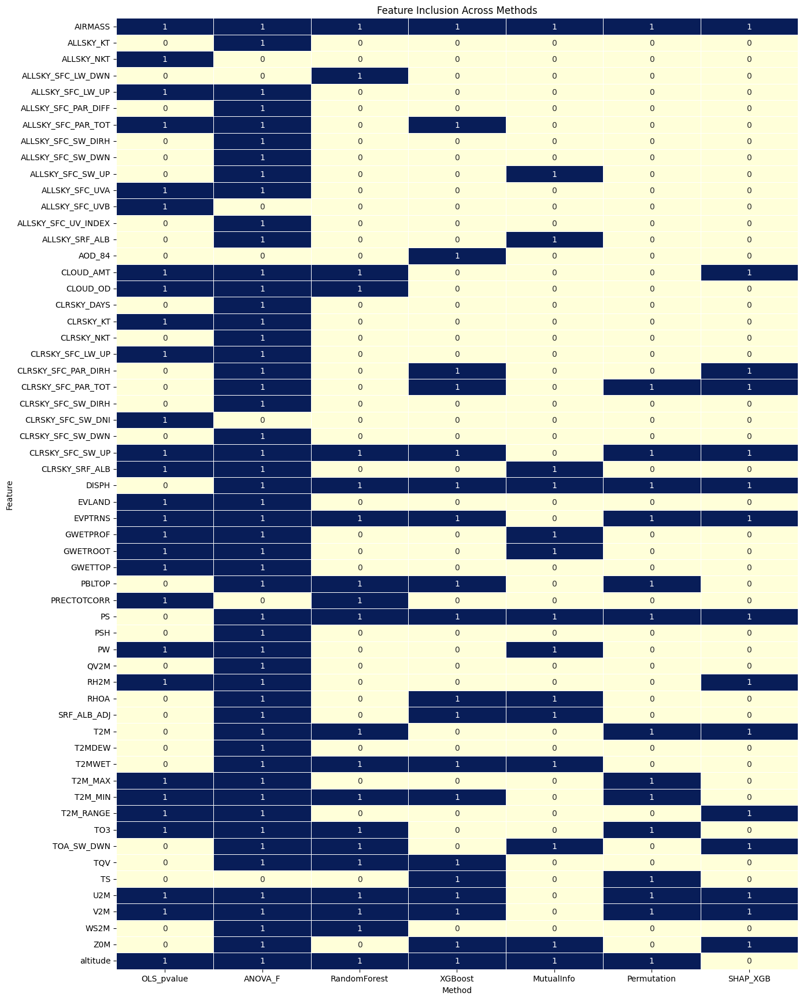

In [ ]:
all_locations_feature_freq_df = plot_feature_frequency_entire(all_locations_important_features, top_n=20)
all_locations_feature_matrix_df = plot_feature_method_matrix_entire(all_locations_important_features)

In [ ]:
#@title Egypt
egypt_important_features = run_feature_importance_eda(egypt, parameters_array, target_col='error', verbose=False)

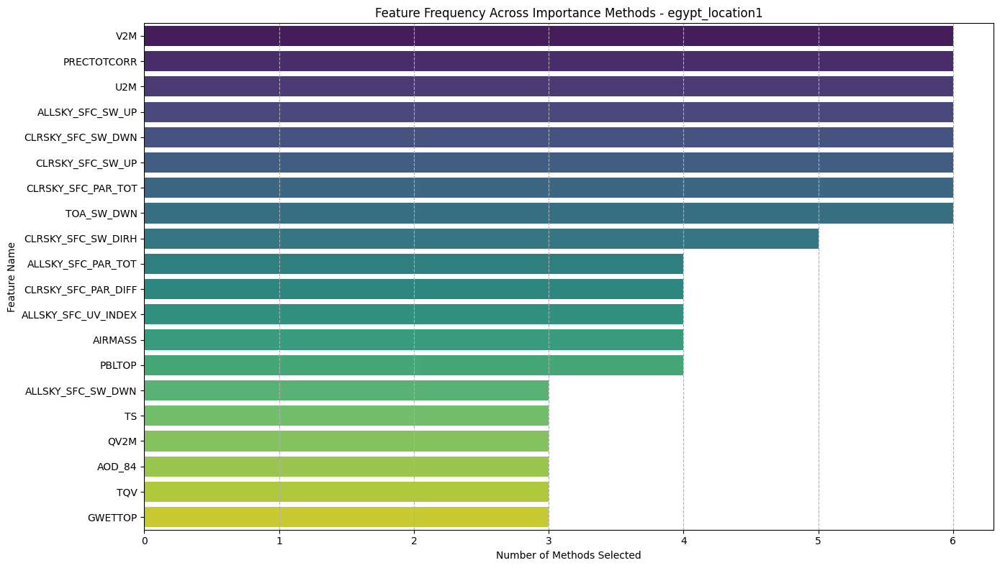

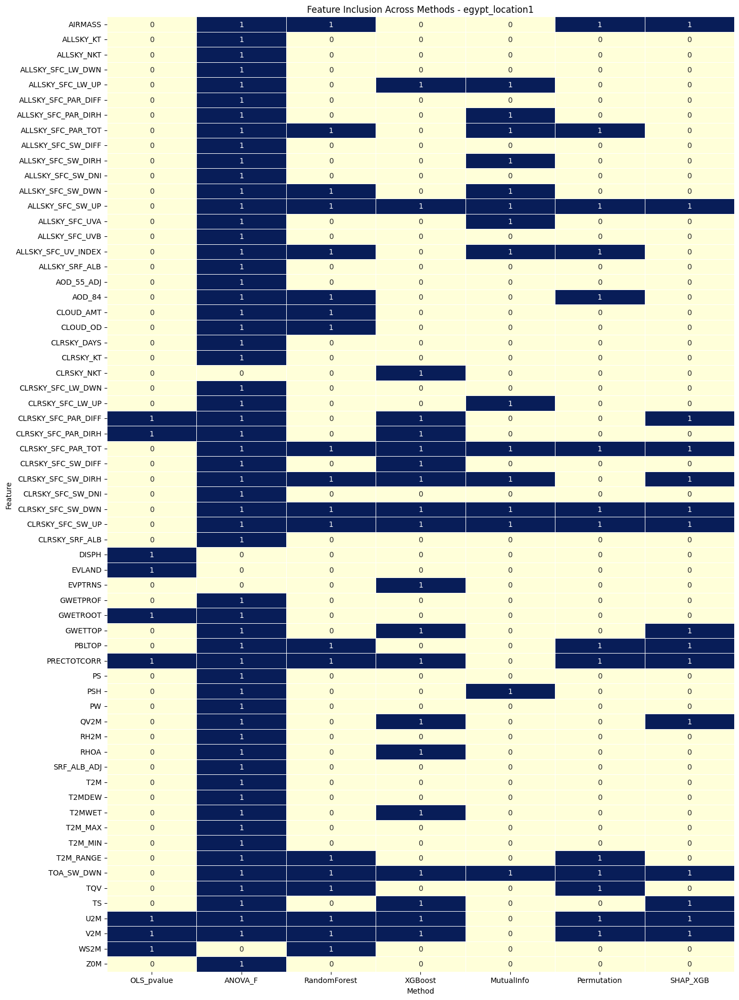

In [ ]:
egypt_feature_freq_df = plot_feature_frequency(egypt_important_features, top_n=20)
egypt_feature_matrix_df = plot_feature_method_matrix(egypt_important_features)
egypt_category_dict = categorize_features_by_frequency(egypt_feature_freq_df)

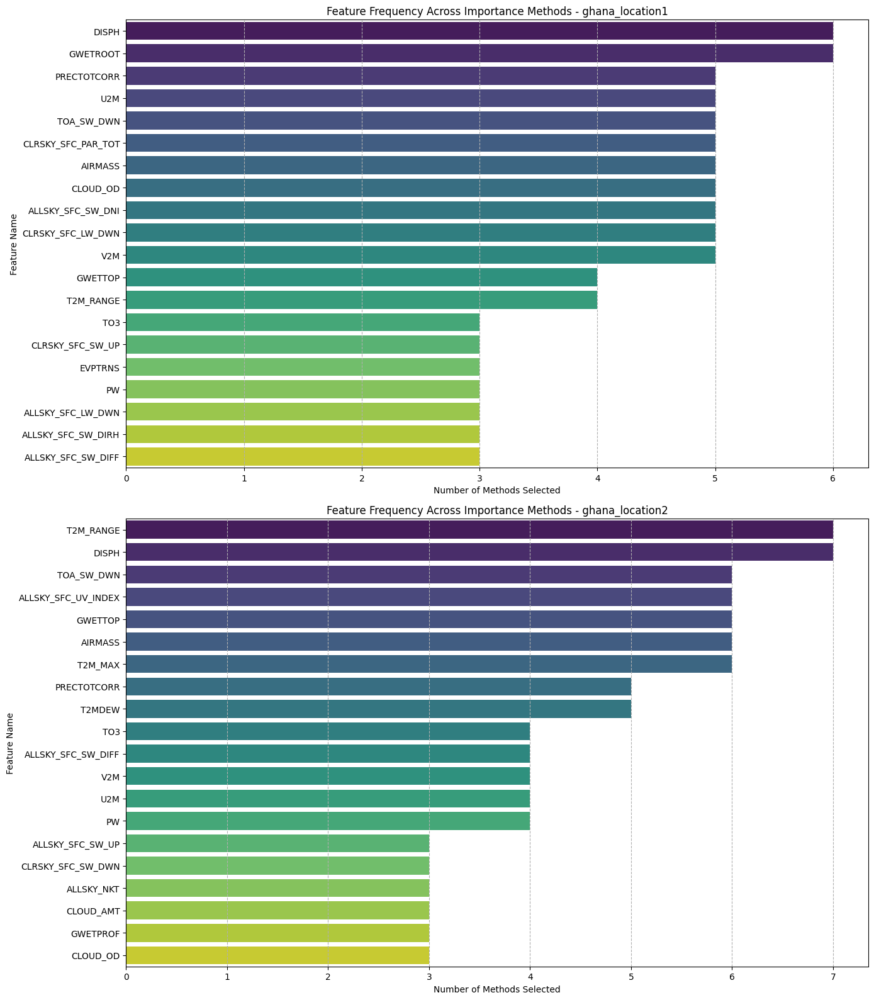

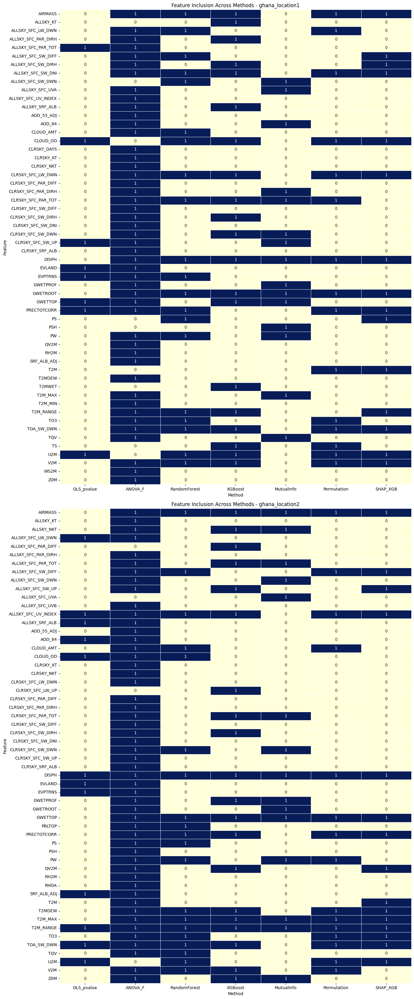

In [ ]:
ghana_important_features = run_feature_importance_eda(ghana, parameters_array, target_col='error', verbose=False)
ghana_feature_freq_df = plot_feature_frequency(ghana_important_features, top_n=20)
ghana_feature_matrix_df = plot_feature_method_matrix(ghana_important_features)
ghana_category_dict = categorize_features_by_frequency(ghana_feature_freq_df)
# print("Strong features:", ghana_category_dict['strong'])

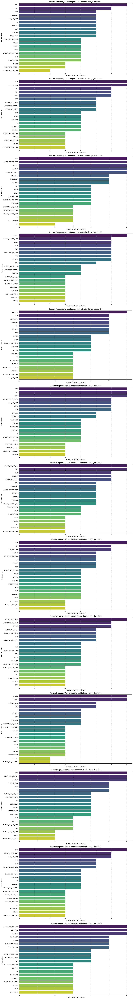

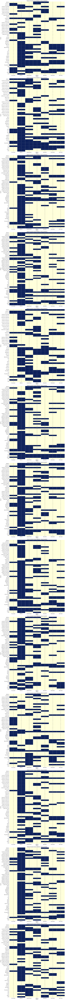

In [ ]:
kenya_important_features = run_feature_importance_eda(kenya, parameters_array, target_col='error', verbose=False)
kenya_feature_freq_df = plot_feature_frequency(kenya_important_features, top_n=20)
kenya_feature_matrix_df = plot_feature_method_matrix(kenya_important_features)
kenya_category_dict = categorize_features_by_frequency(kenya_feature_freq_df)

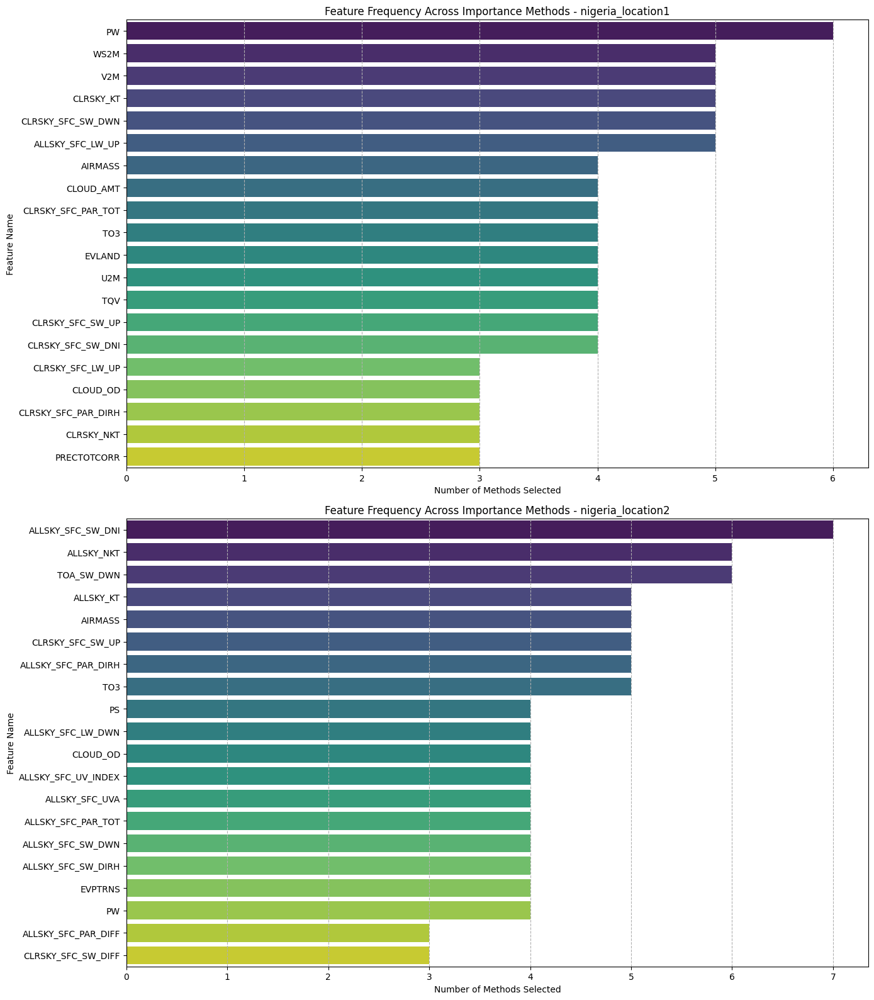

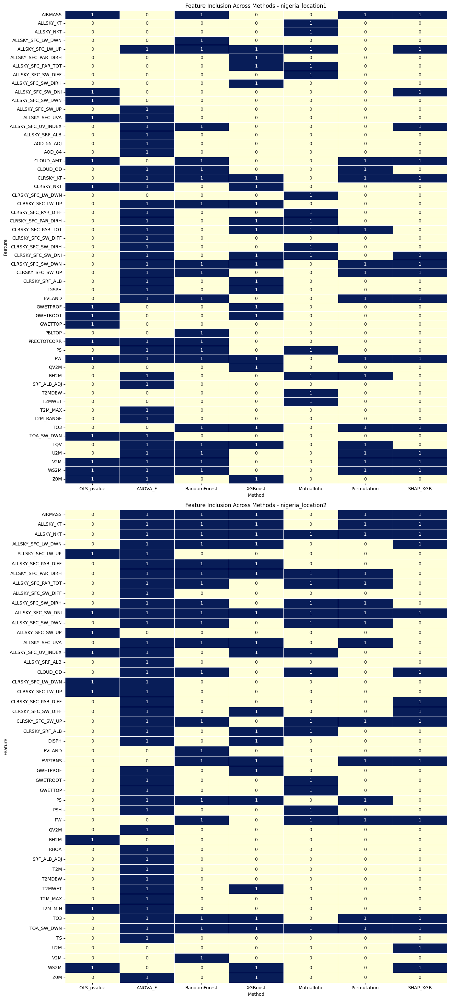

In [ ]:
nigeria_important_features = run_feature_importance_eda(nigeria, parameters_array, target_col='error', verbose=False)
nigeria_feature_freq_df = plot_feature_frequency(nigeria_important_features, top_n=20)
nigeria_feature_matrix_df = plot_feature_method_matrix(nigeria_important_features)
nigeria_category_dict = categorize_features_by_frequency(nigeria_feature_freq_df)

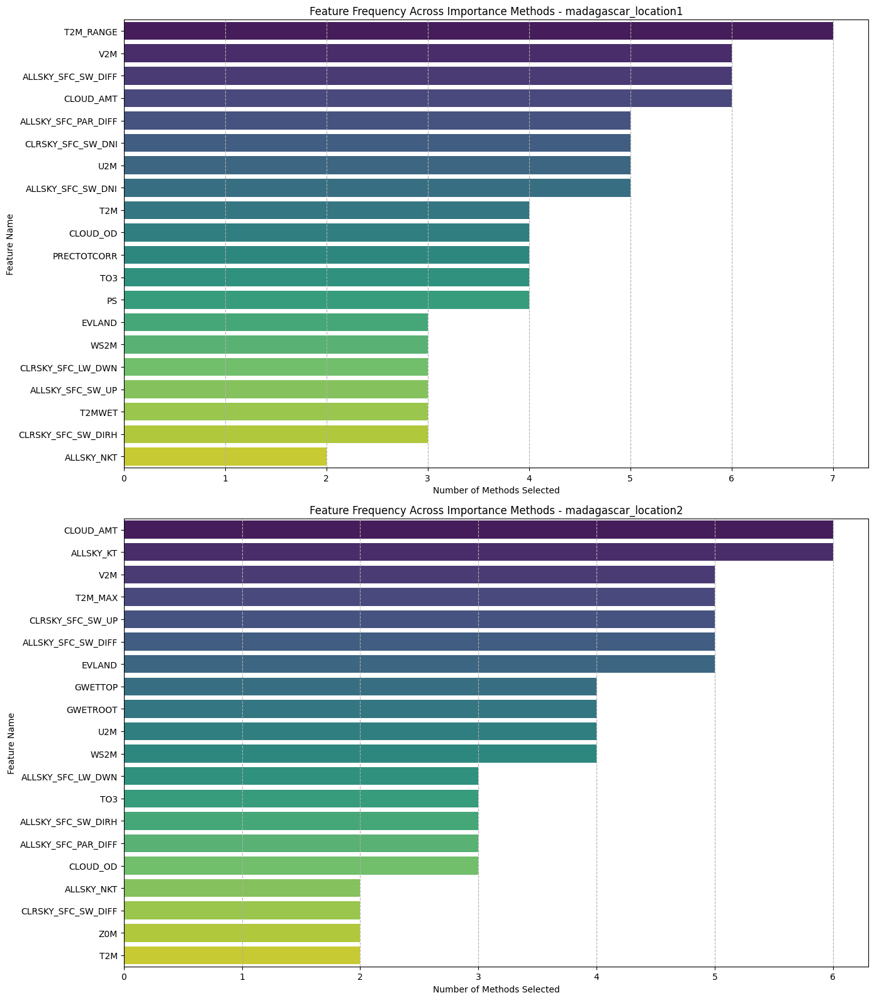

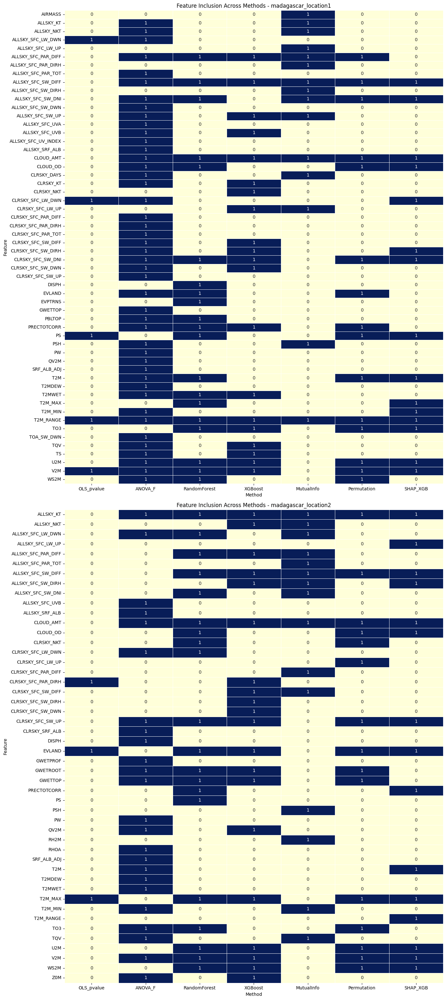

In [ ]:
madagascar_important_features = run_feature_importance_eda(madagascar, parameters_array, target_col='error', verbose=False)
madagascar_feature_freq_df = plot_feature_frequency(madagascar_important_features, top_n=20)
madagascar_feature_matrix_df = plot_feature_method_matrix(madagascar_important_features)
madagascar_category_dict = categorize_features_by_frequency(madagascar_feature_freq_df)

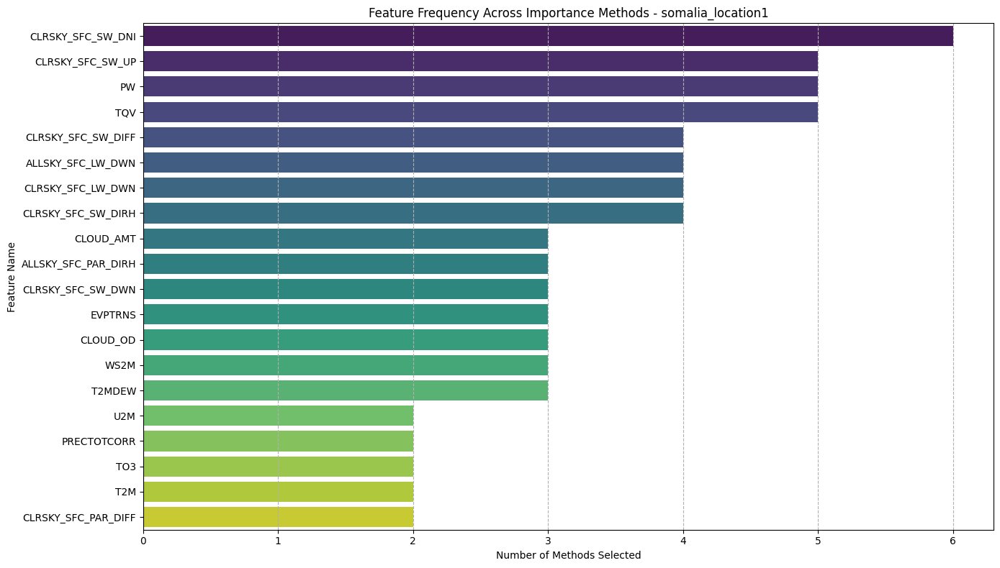

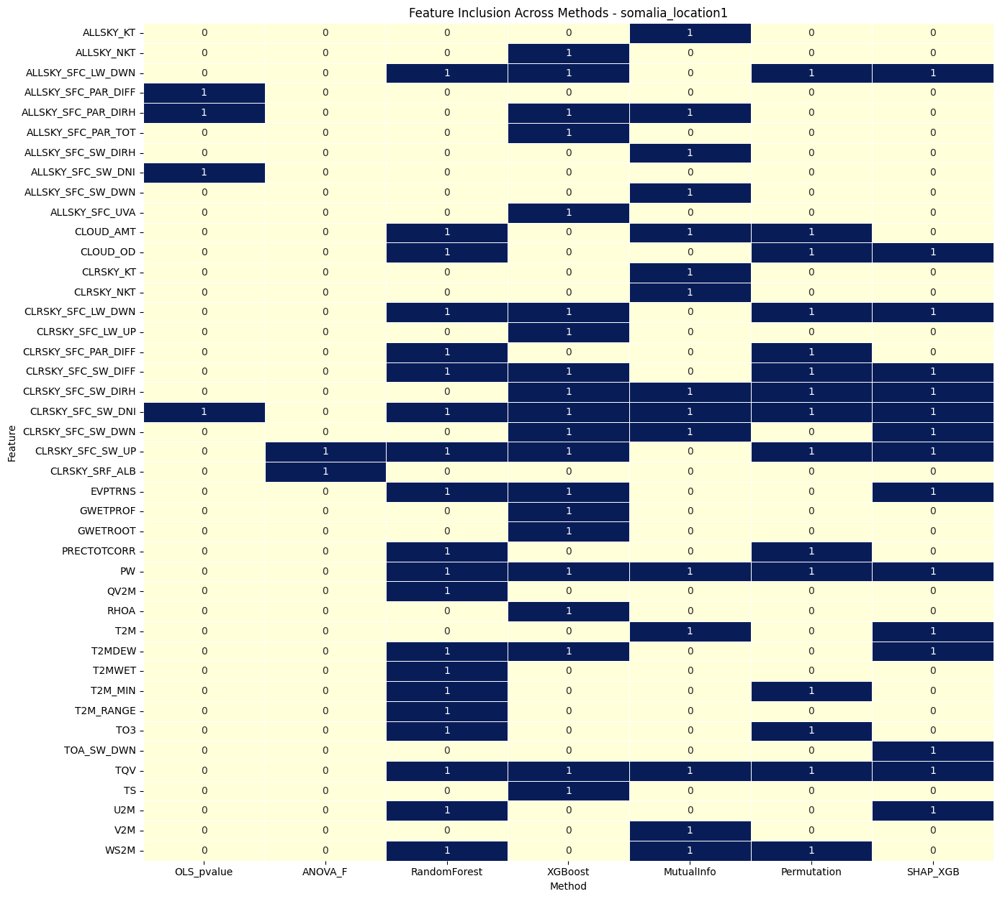

In [ ]:
somalia_important_features = run_feature_importance_eda(somalia, parameters_array, target_col='error', verbose=False)
somalia_feature_freq_df = plot_feature_frequency(somalia_important_features, top_n=20)
somalia_feature_matrix_df = plot_feature_method_matrix(somalia_important_features)
somalia_category_dict = categorize_features_by_frequency(somalia_feature_freq_df)

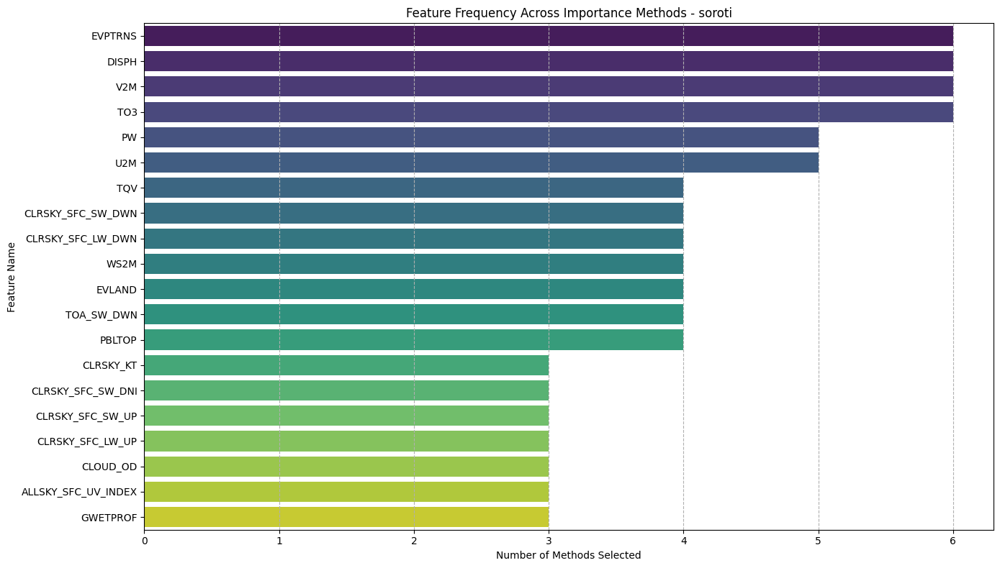

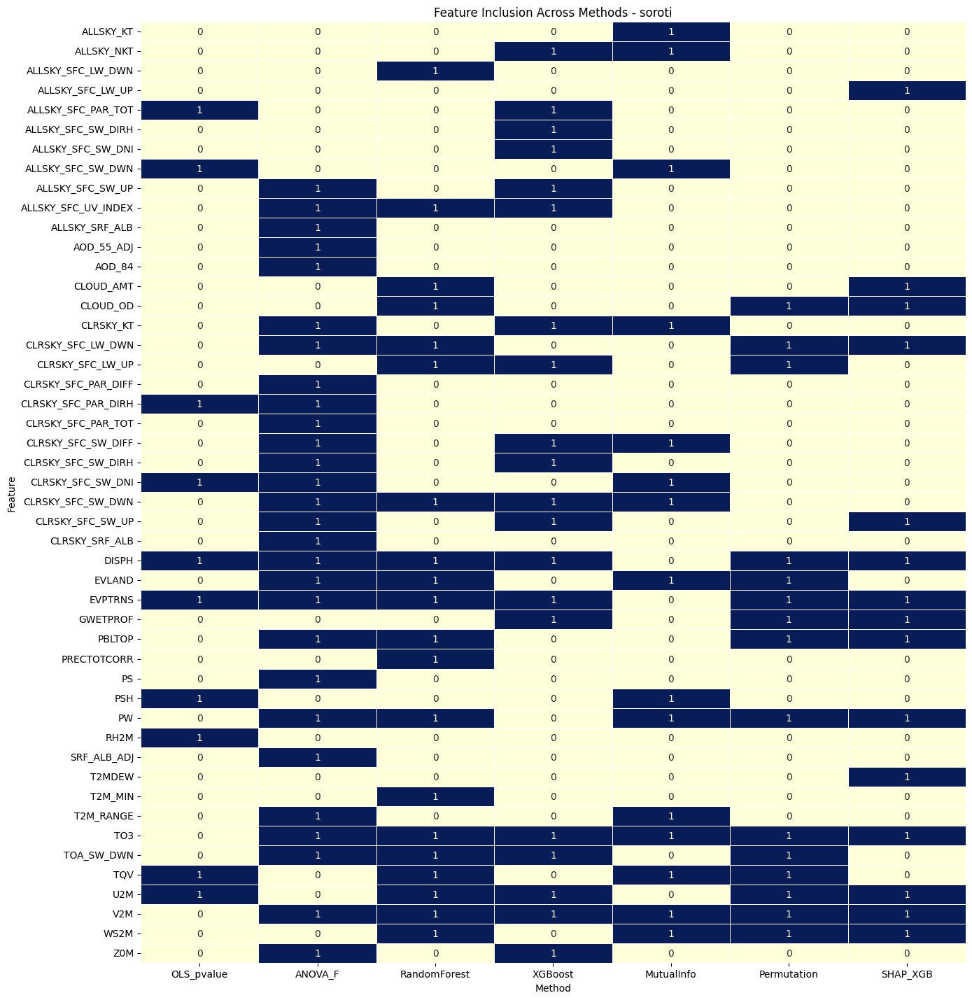

In [ ]:
soroti_important_features = run_feature_importance_eda(soroti, parameters_array, target_col='error', verbose=False)
soroti_feature_freq_df = plot_feature_frequency(soroti_important_features, top_n=20)
soroti_feature_matrix_df = plot_feature_method_matrix(soroti_important_features)
soroti_category_dict = categorize_features_by_frequency(soroti_feature_freq_df)

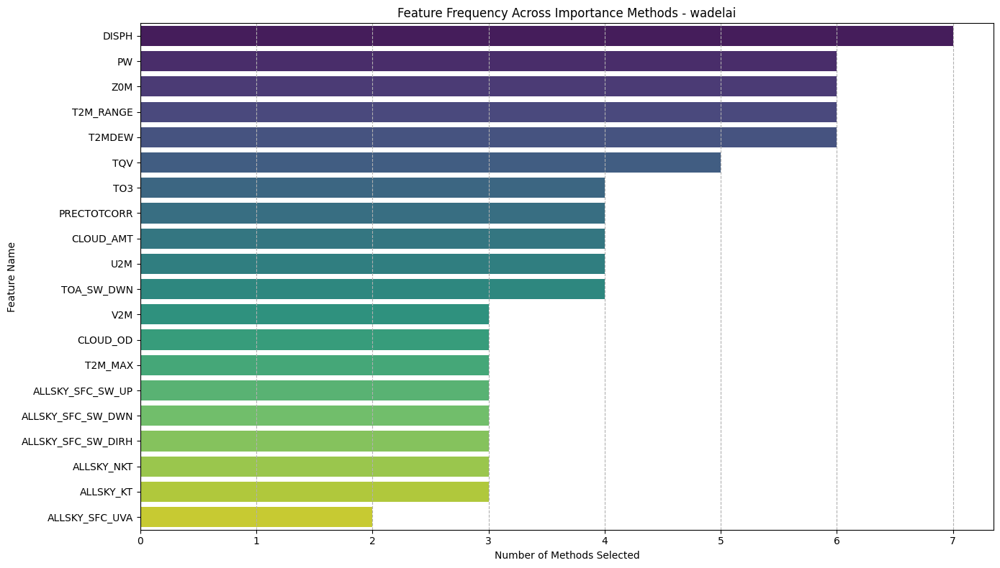

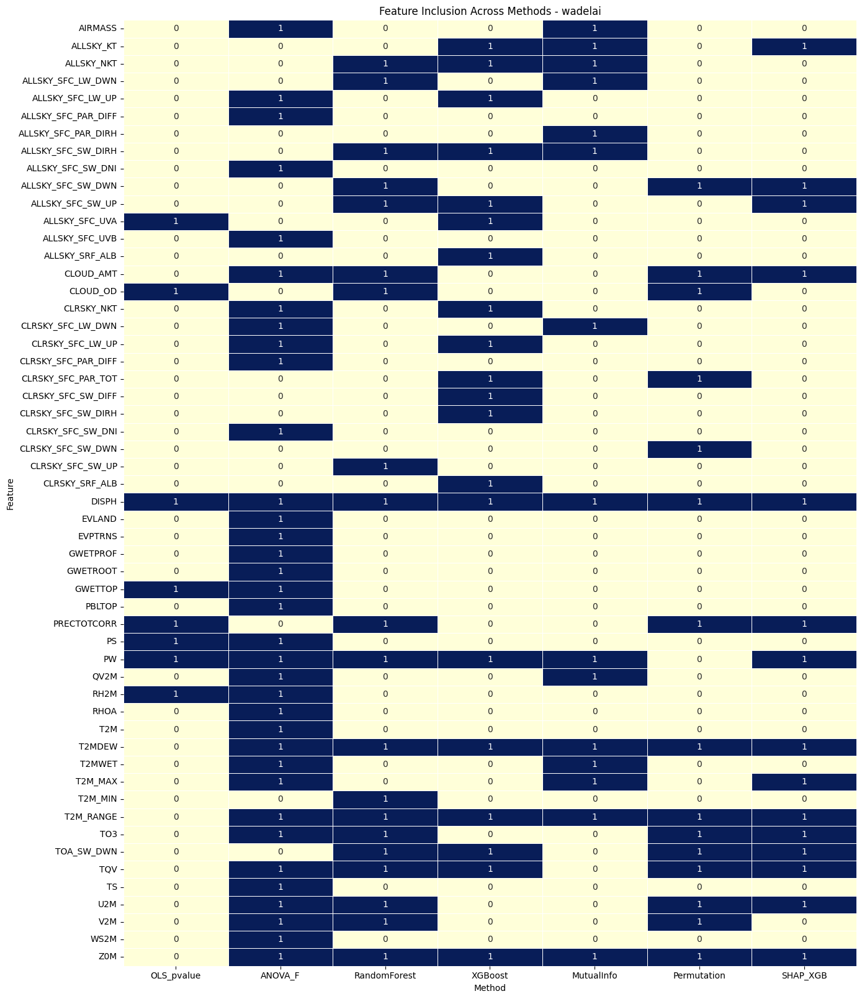

In [ ]:
wadelai_important_features = run_feature_importance_eda(wadelai, parameters_array, target_col='error', verbose=False)
wadelai_feature_freq_df = plot_feature_frequency(wadelai_important_features, top_n=20)
wadelai_feature_matrix_df = plot_feature_method_matrix(wadelai_important_features)
wadelai_category_dict = categorize_features_by_frequency(wadelai_feature_freq_df)